## Script for analysing changes over time in Sebasitan Viscaino Bay. 
##### One section with the bay, one without and one where they are subtracted from eachother to show the difference. 

In [1]:
from xmitgcm import open_mdsdataset
from MITgcmutils import rdmds
from MITgcmutils import mds
from MITgcmutils import diagnostics
import xmitgcm 
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as dat
from matplotlib.lines import Line2D
from matplotlib.gridspec import GridSpec
from matplotlib import cm
from matplotlib.ticker import FormatStrFormatter
import xarray as xr
import cmocean
#import time 
import pylab as pl
import IPython
from IPython import display
from matplotlib.animation import FuncAnimation
from matplotlib import animation
from math import radians, cos, sin, asin, sqrt
from statistics import mean
import netCDF4 as nc
from scipy.io import savemat
import scipy as sc
import scipy.io as sio
import scipy.signal as sig
import datetime
import warnings
warnings.filterwarnings("ignore")

In [2]:
params = {'font.size': 30,
          'figure.figsize': (30, 30),
         'font.family':'serif'}
pl.rcParams.update(params)

In [3]:
%matplotlib inline

### Loading values

In [4]:
dsw = xr.open_dataset("/media/amelia/Trillian/SVB/exp06_512x612x100_ORL_SVB/01_SVB_febTS/ETAwithSVBACall.nc")

In [5]:
dsn = xr.open_dataset("/media/amelia/Trillian/SVB/exp06_512x612x100_ORL/01_noSVB_febTS/ETAnoSVBACall.nc")

In [6]:
data_dirWITH= '/media/amelia/Trillian/SVB/exp06_512x612x100_ORL_SVB/01_SVB_febTS/'
data_dirNO= '/media/amelia/Trillian/SVB/exp06_512x612x100_ORL/01_noSVB_febTS/'

In [ ]:
iters = np.arange(2880,14400,20)

dswall=open_mdsdataset(data_dirWITH,data_dirWITH,prefix=['eta'],default_dtype='>f4',iters=iters)
dsnall=open_mdsdataset(data_dirNO,data_dirNO,prefix=['eta'],default_dtype='>f4',iters=iters)

In [ ]:
def butter_lowpass(cutoff, fs, order):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = sig.butter(order, normal_cutoff, btype='bandpass', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = sig.filtfilt(b, a, data)
    return y

def loadMITgcmValues(dsw,dsn,dswAC,dsnAC,dep,detrend,filtering,detrendAC,filteringAC):
    valw=dsw.ETAN
    valn=dsn.ETAN
    TIME=dsw.time.astype(int).values*1e-9
    VAL=valw.values-valn.values 

    hFacC = dsn.hFacC.values

    hfa = np.ma.masked_values(hFacC, dep)
    mask = np.ma.getmask(hfa)

    LON=dsw.XC-360
    LAT=dsw.YC
    Z=dsw.Z
    depth=dsw.Depth
    
    ind30=220 #30° N
    ind307=220+50 #30.7° N
    ind314=220+100 #31.4° N
    ind32=220+150 #32° N
    
    
    valacw=dswAC.ETA
    valacn=dsnAC.ETA
    VALac=valacw.values-valacn.values
    
    dist=dswAC.x 
    lon_ac=dswAC.lonAC
    lat_ac=dswAC.latAC

    TIMEac=(dswAC.time.astype(int).values)*(1e-9)
    
    if detrend==1:
        VALdif=sig.detrend(VAL,0)
        if filtering==1:
            VALfilt=np.zeros(np.shape(VALdif))

            order = 3
            fs = 1/1200       
            cutoff =np.array([1/432000, 1/43200])

            for d in np.arange(np.size(VALdif,1)):
                for k in np.arange(np.size(VALdif,2)):
                    data = VALdif[:,d,k]
                    VALfilt[:,d,k] = butter_lowpass_filter(data, cutoff, fs, order)
    else:
        VALdif=0
        VALfilt=0
    
    if detrendAC==1:
        VALdifac=sig.detrend(VALac,0)
    if filteringAC==1:
        VALfiltac=np.zeros(np.shape(VALdifac))

        order = 3
        fs = 1/1200       
        cutoff =np.array([1/432000, 1/43200])
            
        for d in np.arange(np.size(VALdifac,1)):
            data = VALdifac[:,d]
            VALfiltac[:,d] = butter_lowpass_filter(data, cutoff, fs, order)
    else:
        VALdifac=0
        VALfiltac=0

            
            
    return(VAL,mask, TIME,LON,LAT,Z,depth,VALac,dist,lon_ac,lat_ac,TIMEac,VALdif,VALfilt,VALdifac,VALfiltac,ind30,ind307,ind314,ind32) 

In [ ]:
dep=0
detrend=1
filtering=1
detrendAC=1
filteringAC=1

etaPRE,maskw, TIME,LON,LAT,Z,depth,etaPREac,dist,lon_ac,lat_ac,TIMEac,etadifall,etafiltall,\
etadif,etafilt,ind30,ind307,ind314,ind32=loadMITgcmValues(dswall,dsnall,dsw,\
                                                             dsn,dep,detrend,filtering,detrendAC,filteringAC)

### Saving filtered data to be used quicker

In [ ]:
FILENAME='/media/amelia/Trillian/SVB/ETA.nc'
ds = xr.Dataset({'ETAfiltall': (("time","y","x"), etafiltall),
                 'ETAdifall': (("time","y","x"), etadifall),
                 'ETAdifcoast': (("time","dist"),etadif),
                 'ETAfiltcoast':(("time","dist"),etafilt)
                    },
                coords ={
                    "x" : LON.values,
                    "y" : LAT.values,
                    "time": TIME,
                    "dist":dist.values
                },
                )
ds.to_netcdf(FILENAME)

### Create a Butterworth lowpass filter

In [28]:
params = {'font.size': 16,
          'figure.figsize': (9, 9),
         'font.family':'sans'}
pl.rcParams.update(params)

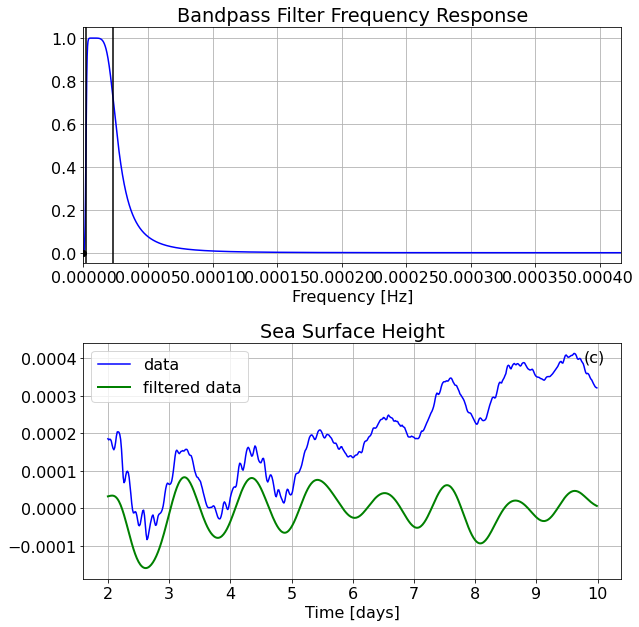

In [30]:
# Setting standard filter requirements.
order = 3
fs = 1/1200       
cutoff =np.array([1/432000, 1/43200])

b, a = butter_lowpass(cutoff, fs, order)

# Plotting the frequency response.
w, h = sig.freqz(b, a, worN=8000)
plt.subplot(2, 1, 1)
plt.plot(0.5*fs*w/np.pi, np.abs(h), 'b')
plt.plot(cutoff, 'ko')
plt.axvline(cutoff[0], color='k')
plt.axvline(cutoff[1], color='k')
plt.xlim(0, 0.5*fs)
plt.title("Bandpass Filter Frequency Response")
plt.xlabel('Frequency [Hz]')
plt.grid()


# Creating the data for filteration
t=TIME*60
d=42
data = etadif[:,d*1]

# Filtering and plotting
y = butter_lowpass_filter(data, cutoff, fs, order)

ax=plt.subplot(2, 1, 2)
ax.plot(t/(60*60*24), etaPREac[:,d*1], 'b-', label='data')
ax.plot(t/(60*60*24), y, 'g-', linewidth=2, label='filtered data')
ax.set_xlabel('Time [days]')
ax.set_title("Sea Surface Height")
ax.text(0.95,0.92,'(c)',horizontalalignment='center',transform=ax.transAxes)
ax.grid()
ax.legend()

plt.tight_layout()
#ax.subplots_adjust(hspace=0.35)
#ax.show()

### Compare filtered data with unfiltered
##### Calculate period from the filtered data through derivative of the filtered data and where the derivative changes sign

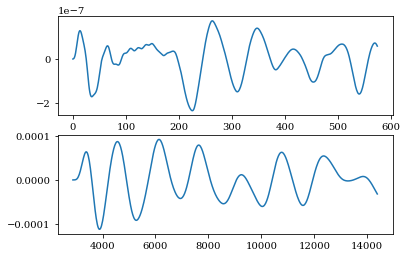

In [11]:
etaderiv=(etafilt[:-1,100]-etafilt[1:,100])/(TIME[:-1]-TIME[1:])
asign=np.sign(etaderiv)
signchange = np.where(((np.roll(asign, 1) - asign) != 0))
timemax=TIME[signchange]
(timemax[2:]-timemax[:-2])/(60*24)


fig,ax=plt.subplots(2)
ax[0].plot((etafilt[:-1,300]-etafilt[1:,300])/(TIME[:-1]-TIME[1:]))
ax[1].plot(TIME[:],etafilt[:,0])

1.9 km from the bay
Mean period after removing anomalies is 1.066 days 
94.7 km from the bay
Mean period after removing anomalies is 1.078 days 
187.6 km from the bay
Mean period after removing anomalies is 1.080 days 
280.7 km from the bay
Mean period after removing anomalies is 1.125 days 
374.0 km from the bay
Mean period after removing anomalies is 1.130 days 
467.4 km from the bay
Mean period after removing anomalies is 1.265 days 
560.9 km from the bay
Mean period after removing anomalies is 1.149 days 
654.8 km from the bay
Mean period after removing anomalies is 1.647 days 
748.9 km from the bay
Mean period after removing anomalies is 1.212 days 
843.4 km from the bay
Mean period after removing anomalies is 1.114 days 
938.2 km from the bay
Mean period after removing anomalies is 1.200 days 
1033.1 km from the bay
Mean period after removing anomalies is 1.662 days 


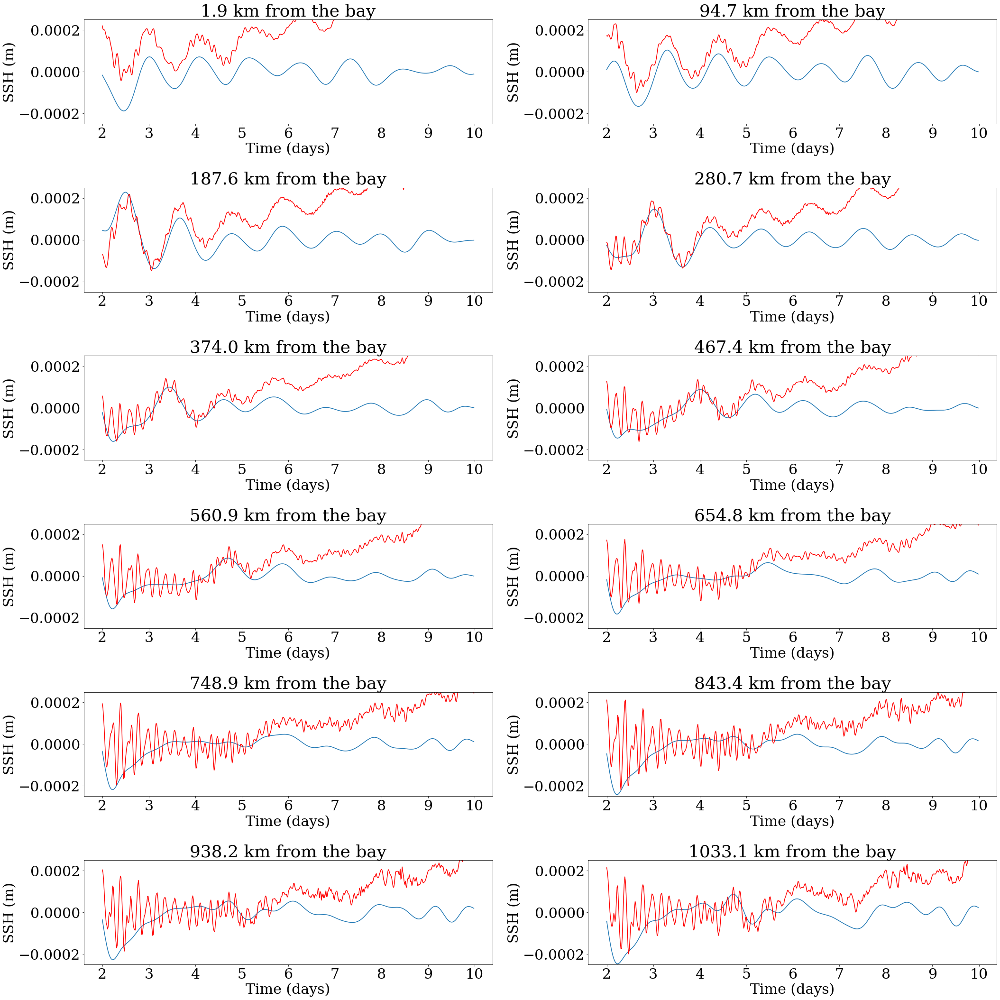

In [31]:
fig,ax=plt.subplots(6,2,figsize=(30,30))

d=50
xlab='Time (days)'
ylab='SSH (m)'
distance=dist.values
VAL=etafilt
VAL2=etaPREac
ylim=[-0.00025, 0.00025]

plt.setp(ax, xticks=[2880, 4320, 5760, 7200, 8640, 10080, 11520, 12960, 14400,], xticklabels=[2, 3, 4, 5, 6, 7, 8, 9, 10])

ax[0,0].plot(TIME, VAL[:,0])
ax[0,0].plot(TIME, VAL2[:,0],'r')
ax[0,0].set(xlabel=xlab, ylabel=ylab)
ax[0,0].set_title('%1.1f km from the bay' %distance[d*0])
ax[0,0].set_ylim(ylim)

ax[0,1].plot(TIME, VAL[:,d])
ax[0,1].plot(TIME, VAL2[:,d],'r')
ax[0,1].set(xlabel=xlab, ylabel=ylab)
ax[0,1].set_title('%1.1f km from the bay' %distance[d*1])
ax[0,1].set_ylim(ylim)

ax[1,0].plot(TIME, VAL[:,d*2])
ax[1,0].plot(TIME, VAL2[:,d*2],'r')
ax[1,0].set(xlabel=xlab, ylabel=ylab)
ax[1,0].set_title('%1.1f km from the bay' %distance[d*2])
ax[1,0].set_ylim(ylim)

ax[1,1].plot(TIME, VAL[:,d*3])
ax[1,1].plot(TIME, VAL2[:,d*3],'r')
ax[1,1].set(xlabel=xlab, ylabel=ylab)
ax[1,1].set_title('%1.1f km from the bay' %distance[d*3])
ax[1,1].set_ylim(ylim)

ax[2,0].plot(TIME, VAL[:,d*4])
ax[2,0].plot(TIME, VAL2[:,d*4],'r')
ax[2,0].set(xlabel=xlab, ylabel=ylab)
ax[2,0].set_title('%1.1f km from the bay' %distance[d*4])
ax[2,0].set_ylim(ylim)

ax[2,1].plot(TIME, VAL[:,d*5])
ax[2,1].plot(TIME, VAL2[:,d*5],'r')
ax[2,1].set(xlabel=xlab, ylabel=ylab)
ax[2,1].set_title('%1.1f km from the bay' %distance[d*5])
ax[2,1].set_ylim(ylim)

ax[3,0].plot(TIME, VAL[:,d*6])
ax[3,0].plot(TIME, VAL2[:,d*6],'r')
ax[3,0].set(xlabel=xlab, ylabel=ylab)
ax[3,0].set_title('%1.1f km from the bay' %distance[d*6])
ax[3,0].set_ylim(ylim)

ax[3,1].plot(TIME, VAL[:,d*7])
ax[3,1].plot(TIME, VAL2[:,d*7],'r')
ax[3,1].set(xlabel=xlab, ylabel=ylab)
ax[3,1].set_title('%1.1f km from the bay' %distance[d*7])
ax[3,1].set_ylim(ylim)

ax[4,0].plot(TIME, VAL[:,d*8])
ax[4,0].plot(TIME, VAL2[:,d*8],'r')
ax[4,0].set(xlabel=xlab, ylabel=ylab)
ax[4,0].set_title('%1.1f km from the bay' %distance[d*8])
ax[4,0].set_ylim(ylim)

ax[4,1].plot(TIME, VAL[:,d*9])
ax[4,1].plot(TIME, VAL2[:,d*9],'r')
ax[4,1].set(xlabel=xlab, ylabel=ylab)
ax[4,1].set_title('%1.1f km from the bay' %distance[d*9])
ax[4,1].set_ylim(ylim)

ax[5,0].plot(TIME, VAL[:,d*10])
ax[5,0].plot(TIME, VAL2[:,d*10],'r')
ax[5,0].set(xlabel=xlab, ylabel=ylab)
ax[5,0].set_title('%1.1f km from the bay' %distance[d*10])
ax[5,0].set_ylim(ylim)

ax[5,1].plot(TIME, VAL[:,d*11])
ax[5,1].plot(TIME, VAL2[:,d*11],'r')
ax[5,1].set(xlabel=xlab, ylabel=ylab)
ax[5,1].set_title('%1.1f km from the bay' %distance[d*11])
ax[5,1].set_ylim(ylim)

fig.tight_layout()

for i in np.arange(0,12,1):

    etaderiv=(etafilt[:-1,d*i]-etafilt[1:,d*i])/(TIME[:-1]-TIME[1:])

    asign=np.sign(etaderiv)
    signchange = np.where(((np.roll(asign, 1) - asign) != 0))

    timemax=TIME[signchange]
    perpre=(timemax[2:]-timemax[:-2])/(60*24)
    per=mean(perpre[perpre>=0.8])
    
    print('%1.1f km from the bay' %distance[d*i])
    print(f'Mean period after removing anomalies is {per:.3f} days ')


### Define how to create Hovmöller plots

In [12]:
def plot_HOVMÖLLER(ax,LON,TIME,VAL,title,vmin,vmax,lat,lines,cbarall):
    #dep_masked = np.ma.masked_values(depth,0) 
    #mask_dep = np.ma.getmask(dep_masked)
    #ax.set_facecolor('wheat')
    xlab='Time [days]'
    ylab='Distance [km]'
    
    #time= TIME.values.astype(int)
    #time=dat.date2num(TIME)
    if lines ==1:
        ind30=220 #30° N
        ind307=220+50 #30.7° N
        ind314=220+100 #31.4° N
        ind32=220+150 #32° N

        dist30=LON[np.where(lat==ind30)]
        dist307=LON[np.where(lat==ind307)]
        dist314=LON[np.where(lat==ind314)]
        dist32=LON[np.where(lat==ind32)]
        
        ax.axhline(y=dist30,color='g',linewidth=5)
        ax.axhline(y=dist307,color='g',linewidth=5)
        ax.axhline(y=dist314[0],color='g',linewidth=5)
        ax.axhline(y=dist32,color='g',linewidth=5)
        #ax.axhline(y=600,color='k',linewidth=5)
        #ax.axhline(y=dist[439],color='k',linewidth=5)
        ax.annotate('30°N',(TIME[500],dist30+30),color='w')
        ax.annotate('30.7°N',(TIME[500],dist307+30),color='w')
        ax.annotate('31.4°N',(TIME[500],dist314+30),color='w')
        ax.annotate('32°N',(TIME[500],dist32+30),color='w')

    ax.set(xlabel=xlab, ylabel=ylab)
    ax.set_xticks([2880, 4320, 5760, 7200, 8640, 10080, 11520, 12960, 14400])
    ax.set_xticklabels([2, 3, 4, 5, 6, 7, 8, 9, 10])
    ax.set_title(title)

    #val=VAL.values
    cax = ax.pcolormesh(TIME,LON,np.transpose(VAL)*1000,vmin=vmin,vmax=vmax, cmap=cmocean.cm.balance)
    #ax.xaxis.set_major_locator(dat.MonthLocator())
    

    
    if cbarall==1:
    ##FOR THE SAME COLORBAR FOR ALL OF THE PLOTS
        cbar_ax = fig.add_axes([1, 0.15, 0.03, 0.7])
        fig.colorbar(cax, cax=cbar_ax)
        cbar_ax.set_ylabel('SSH [mm]')
    else:
    ##FOR A COLORBAR FOR EACH PLOT
        cbar = plt.colorbar(cax)
        cbar.set_label('SSH [mm]')


### Create Hovmöller plot for original data, detrended data & filtered and detrended

In [32]:
params = {'font.size': 30,
          'figure.figsize': (30, 30),
         'font.family':'serif'}
pl.rcParams.update(params)

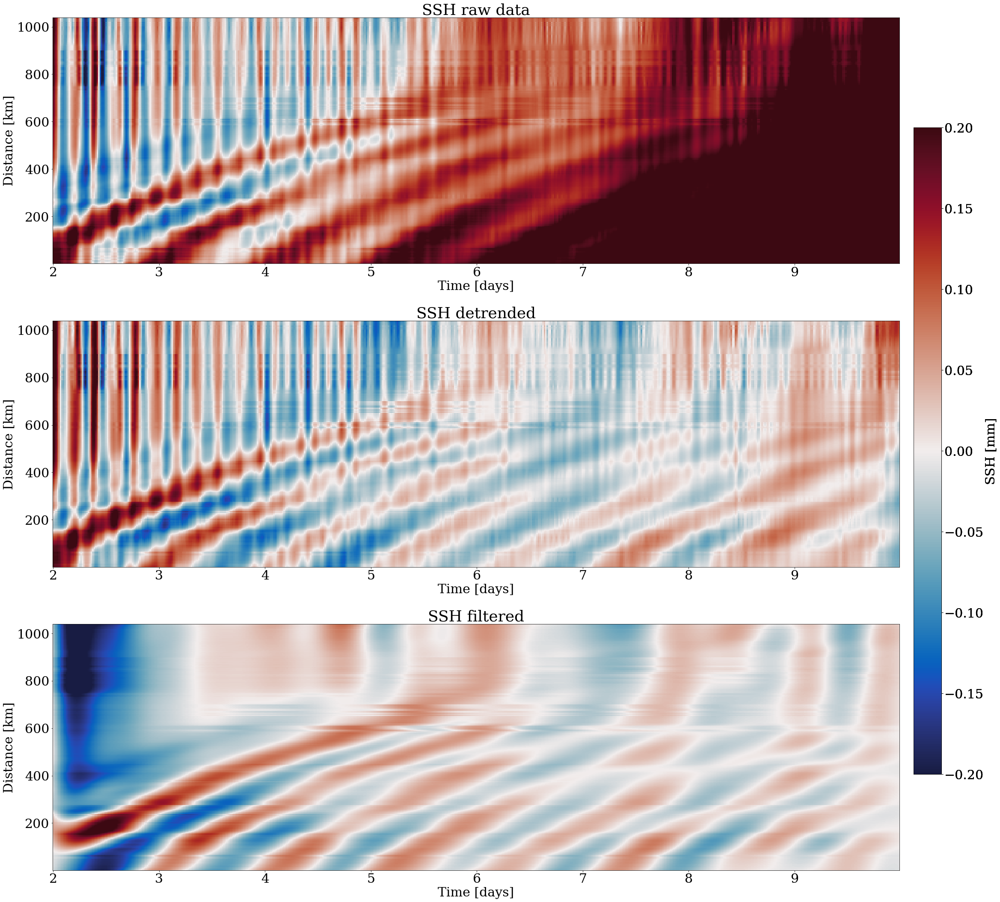

In [34]:
fig, ax = plt.subplots(3)

vmin=-0.2
vmax=0.2

plot_HOVMÖLLER(ax[0],dist,TIME,etaPREac,'SSH raw data',vmin,vmax,lat_ac,0,1)
plot_HOVMÖLLER(ax[1],dist,TIME,etadif,'SSH detrended',vmin,vmax,lat_ac,0,1)
plot_HOVMÖLLER(ax[2],dist,TIME,etafilt,'SSH filtered',vmin,vmax,lat_ac,0,1)



fig.tight_layout()


## Where the points were taken

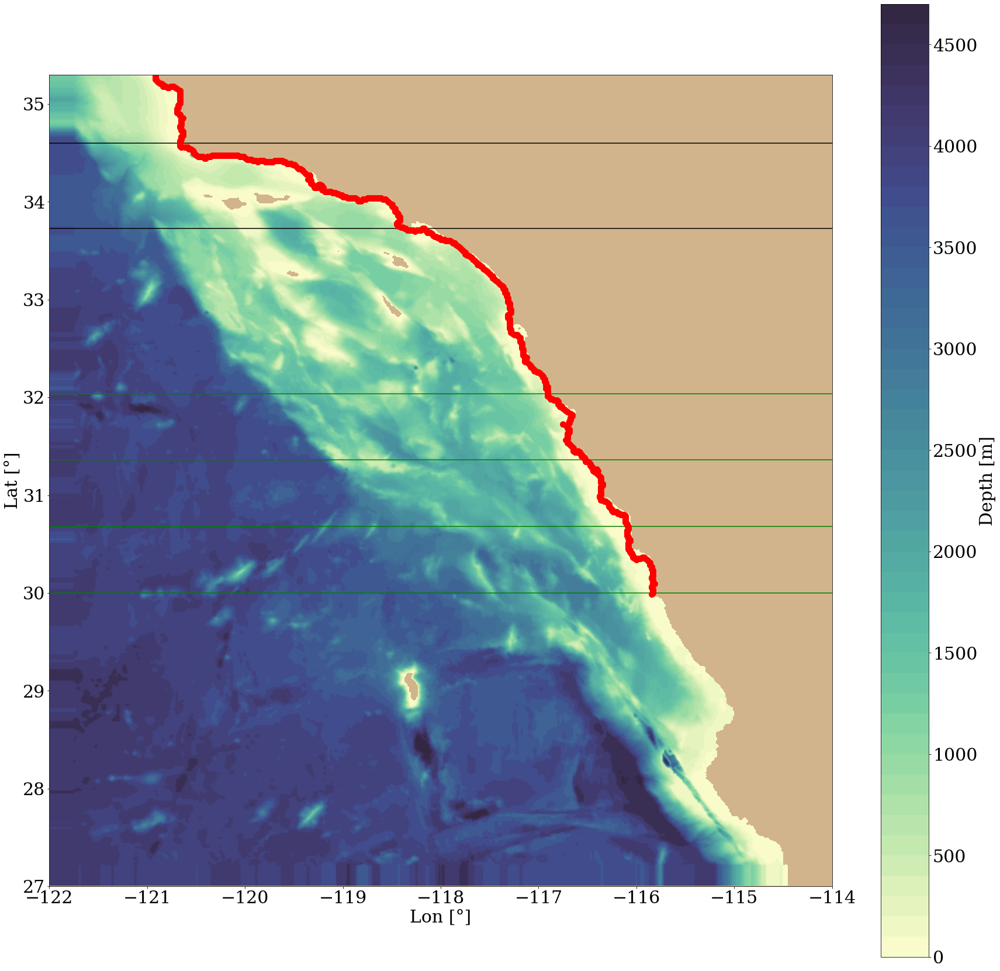

In [18]:
fig, ax = plt.subplots(1,1,figsize=(30,30))
ax.set_facecolor('tan')
pc = ax.contourf(LON,LAT,np.ma.masked_array(depth, mask=maskw[0,:,:]),50,
                 vmin=0, vmax=5000, cmap=cmocean.cm.deep)#, extend='max')
cb = plt.colorbar(pc, extend='max',label='depth / m')
#cn = ax.contour(LON,LAT,depth, colors=['0.3','0.6'], 
 #               levels=[250,500])
    
ind30=220 #30° N
ind307=220+50 #30.7° N
ind314=220+100 #31.4° N
ind32=220+150 #32° N
        
ax.axhline(y=LAT[ind30],color='g')
ax.axhline(y=LAT[ind307],color='g')
ax.axhline(y=LAT[ind314],color='g')
ax.axhline(y=LAT[ind32],color='g')
ax.axhline(y=LAT[lat_ac[321]],color='k')
ax.axhline(y=34.6,color='k')
#ax.axhline(y=30,color='k')

for ii,jj in zip(lon_ac,lat_ac):

    ax.plot(LON[ii-1],LAT[jj-1],'o', 
            markersize=10, color='r')
    #print('Depth at cell is %1.2f m' % (depth[jj-1,ii-1]))

#for ii,jj in zip(lon_inds_2,lat_inds_2):
#    ax.plot(LON[ii],LAT[jj-1],'o', 
#            markersize=4, color='y')

#ax.plot(LON[lon_fix[20]],LAT[lat_fix[20]],'o', 
 #       markersize=4, color='b')


cb.set_label('Depth [m]')
ax.set_xlabel('Lon [°]')
ax.set_ylabel('Lat [°]')
ax.set_xlim(238-360, 246-360)
ax.set_ylim(27,35.3)
ax.set_aspect(1)

### Calculating variables to compare with brink with the attained values from above
#### From Hovmöller and line plots of eta we get a phase speed of 1.16 m/s and period of 1.06-1.25 days 

In [19]:

c=1.16 # (m/s)
period = 1.11 #days mean of 12 values above
freq=1/(period*60*60*24) # (rad/s)
wavenr=freq/(c*100) # (rad/m)
wavelen=((2*np.pi)/(wavenr*100))*1e-3 #(km)
print('k (rad/cm) ', wavenr)
print('lambda (km) ', wavelen)
print('omega (rad/s) ', freq)
print('period (days)', period)
print('c (m/s)', c)

k (rad/cm)  8.988873931402668e-08
lambda (km)  698.9958202917112
omega (rad/s)  1.0427093760427093e-05
period (days) 1.11
c (m/s) 1.16


#### Calculate phase speed with lagged correlation

In [21]:
index30=np.where(lat_ac==ind30)
index307=np.where(lat_ac==ind307)
index314=np.where(lat_ac==ind314)
index32=np.where(lat_ac==ind32)


##### For the latitudes in Brink

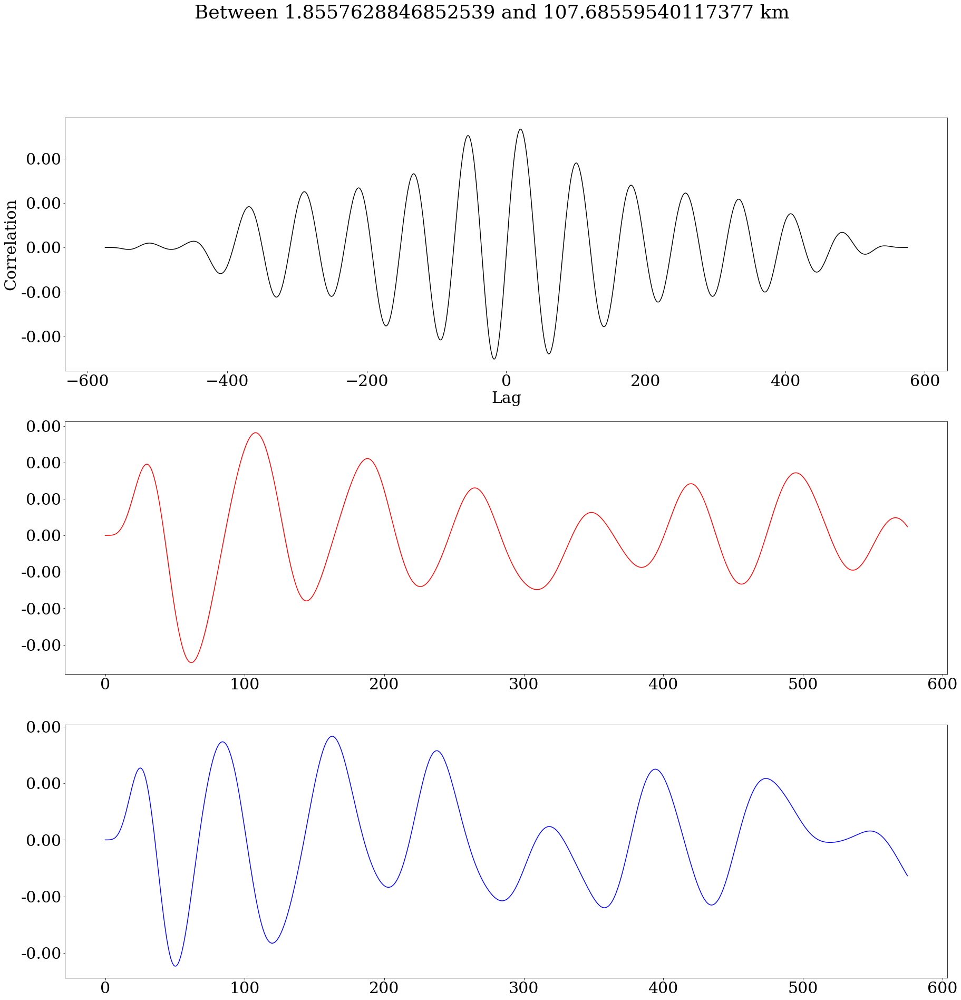

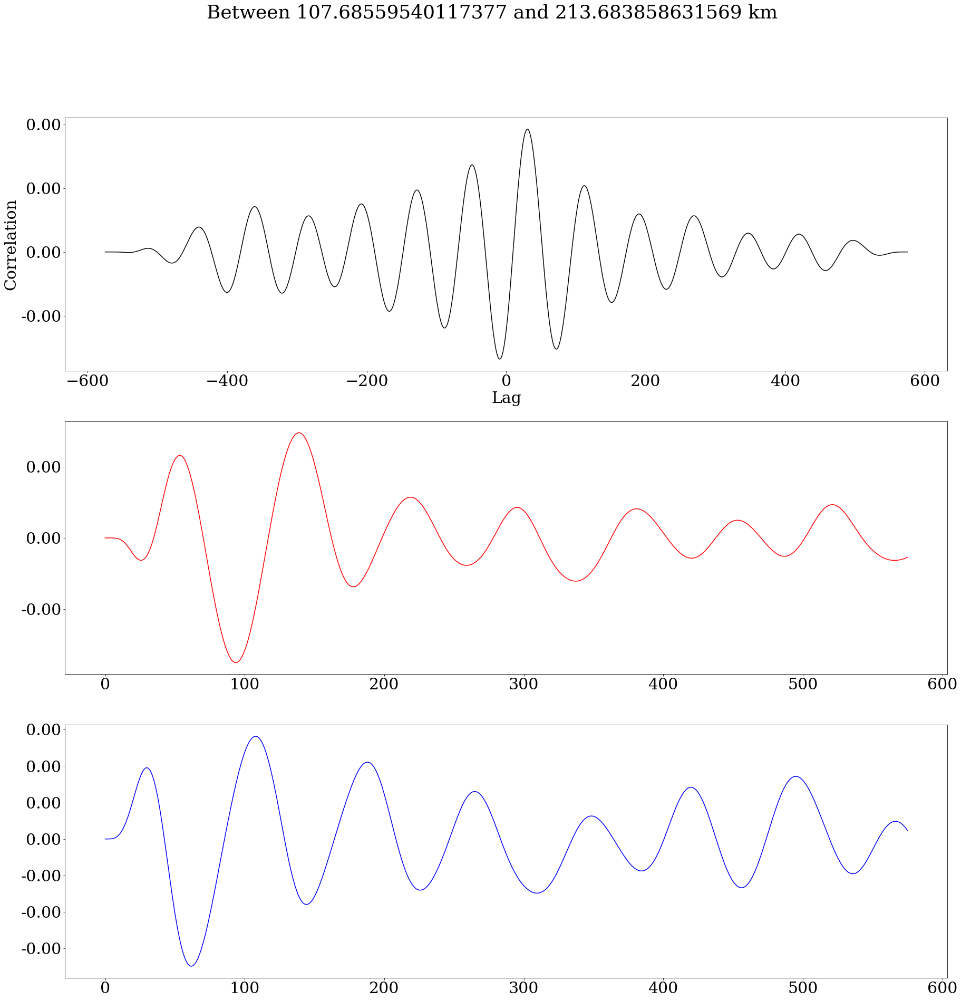

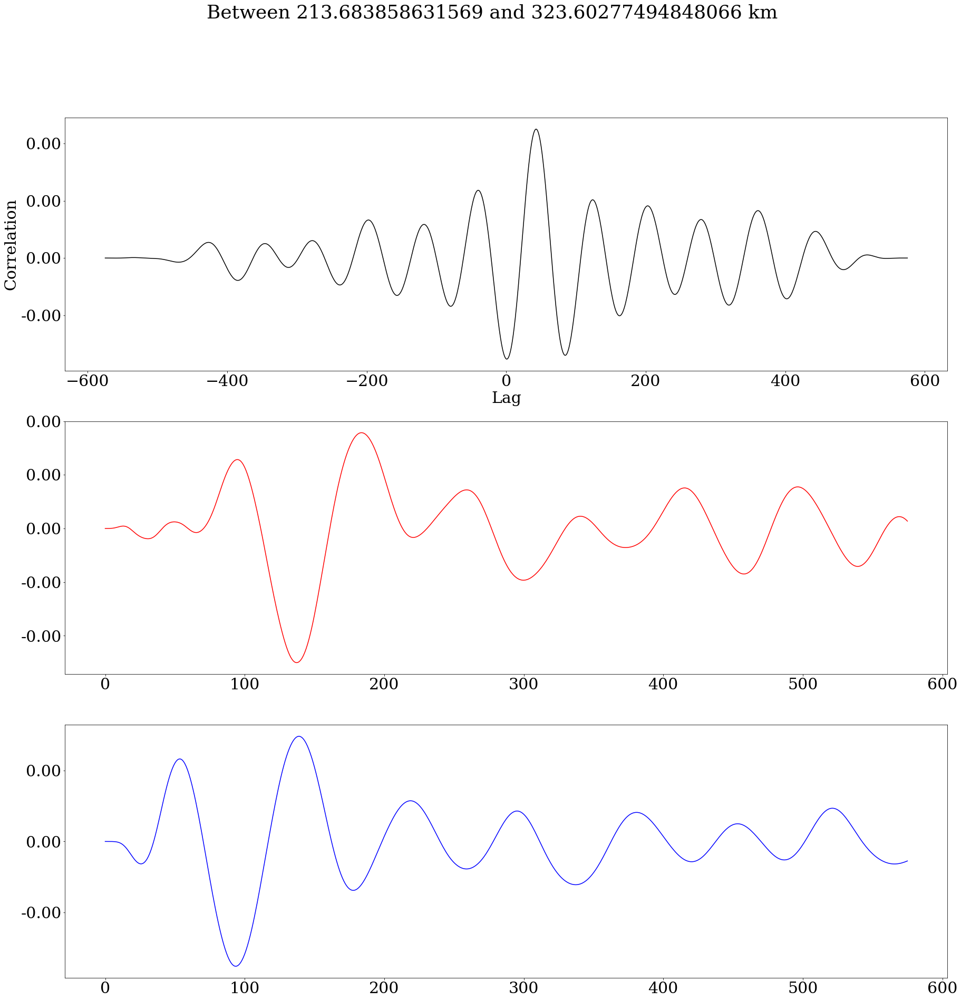

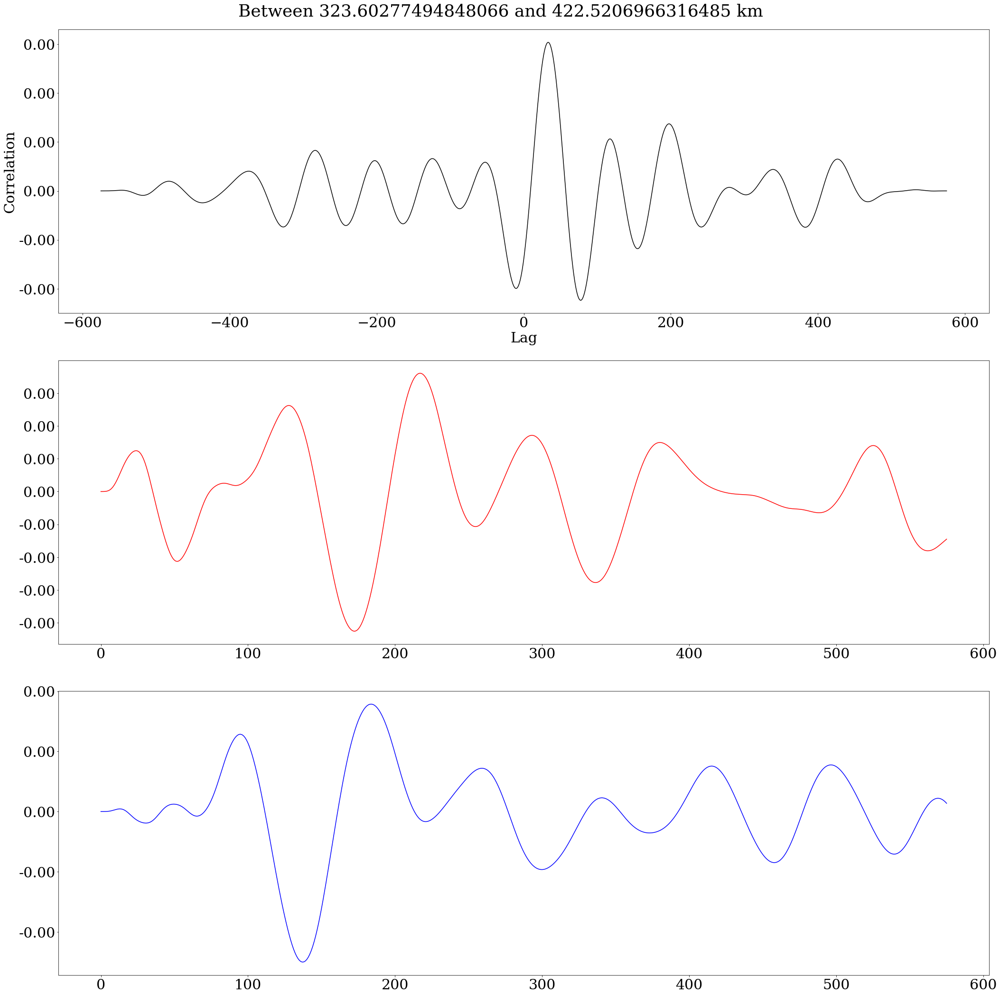

In [22]:
lag=np.zeros(4)
p=0

xlab='Lag'
ylab='Correlation'

for i in np.arange(1,5,1):
    p=p+1
    index=[0,57,114,173,226]
    in1=etafilt[:,index[i]]
    in2=etafilt[:,index[i-1]]
    out=sig.correlate(in1, in2)
    lags = sig.correlation_lags(in1.size, in2.size)
    lag[p-1] = lags[np.argmax(out)]
    fig,ax=plt.subplots(3)
    
    ax[0].plot(lags,out,'k')
    ax[1].plot(in1,'r')
    ax[2].plot(in2,'b')
    ax[0].set(xlabel=xlab, ylabel=ylab)
    
    ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    fig.suptitle(f'Between {dist[index[i-1]].values} and {dist[index[i]].values} km')
    
fig.tight_layout()

In [23]:
index=[0,57,114,173,226]
c=-((dist[index[:-1]].values-dist[index[1:]].values)*1000)/((TIME[lag.astype(int)]-2880)*60)

In [24]:
c

array([4.40957635, 2.9443962 , 2.13021156, 2.49792732])

In [34]:
params = {'font.size': 28,
          'figure.figsize': (30, 15),
         'font.family':'serif'}
pl.rcParams.update(params)


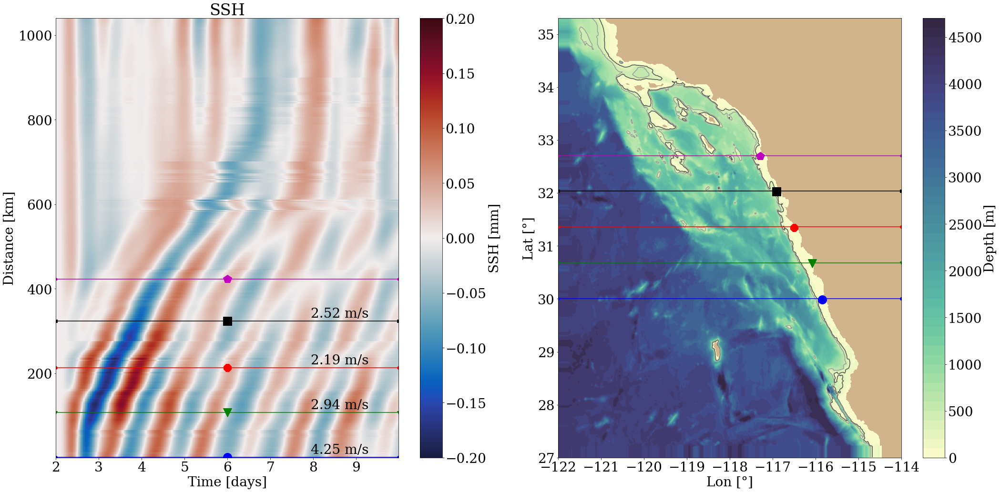

In [35]:
fig = plt.figure()
gs = GridSpec(nrows=1, ncols=2)#, height_ratios=[1,1])

lines=0
cbarall=0
vmin=-0.2
vmax=0.2
markers=Line2D.filled_markers
markers=np.delete(markers,np.arange(2,5,1))
colors=['b','g','r','k','m','c','y','brown','lime','fuchsia']

ax0 = fig.add_subplot(gs[0, 0])
plot_HOVMÖLLER(ax0,dist,TIME,etafilt,'SSH',vmin,vmax,lat_ac,lines,cbarall)

p=0
index=[0,57,114,173,226]
for i in index:
    p=p+1
    ax0.plot(np.ones_like(dist[i])*TIME[288],dist[i],'o', 
            markersize=18, color=colors[p-1],marker=markers[p-1])
    ax0.axhline(y=dist[i],color=colors[p-1],marker=markers[p-1])
    if i!=226:
        ax0.annotate(f'{c[p-1]:.2f} m/s',(TIME[428],dist[i+5]))


ax3 = fig.add_subplot(gs[0,1])
ax3.set_facecolor('tan')
pc = ax3.contourf(LON,LAT,np.ma.masked_array(depth, mask=maskw[0,:,:]),50,
                 vmin=0, vmax=5000, cmap=cmocean.cm.deep)#, extend='max')
cb = plt.colorbar(pc, extend='max',label='depth / m')
cn = ax3.contour(LON,LAT,depth, colors=['0.3','0.6'], 
                levels=[250,500])


p=0
for i in index:
    p=p+1
    ax3.axhline(y=LAT[lat_ac[i]],color=colors[p-1],marker=markers[p-1])
#ax3.annotate('800 km from the bay',xy=(340,350), xytext=(340, 350+50),xycoords='axes points',fontsize=10)
p=0
for ii,jj in zip(lon_ac[index],lat_ac[index]):
    p=p+1
    ax3.plot(LON[ii-1],LAT[jj-1],marker=markers[p-1], 
            markersize=18, color=colors[p-1])


cb.set_label('Depth [m]')
ax3.set_xlabel('Lon [°]')
ax3.set_ylabel('Lat [°]')
ax3.set_xlim(238-360, 246-360)
ax3.set_ylim(27,35.3)
#ax3.set_aspect(1)
fig.tight_layout()

###### For the evenly spaced out distances

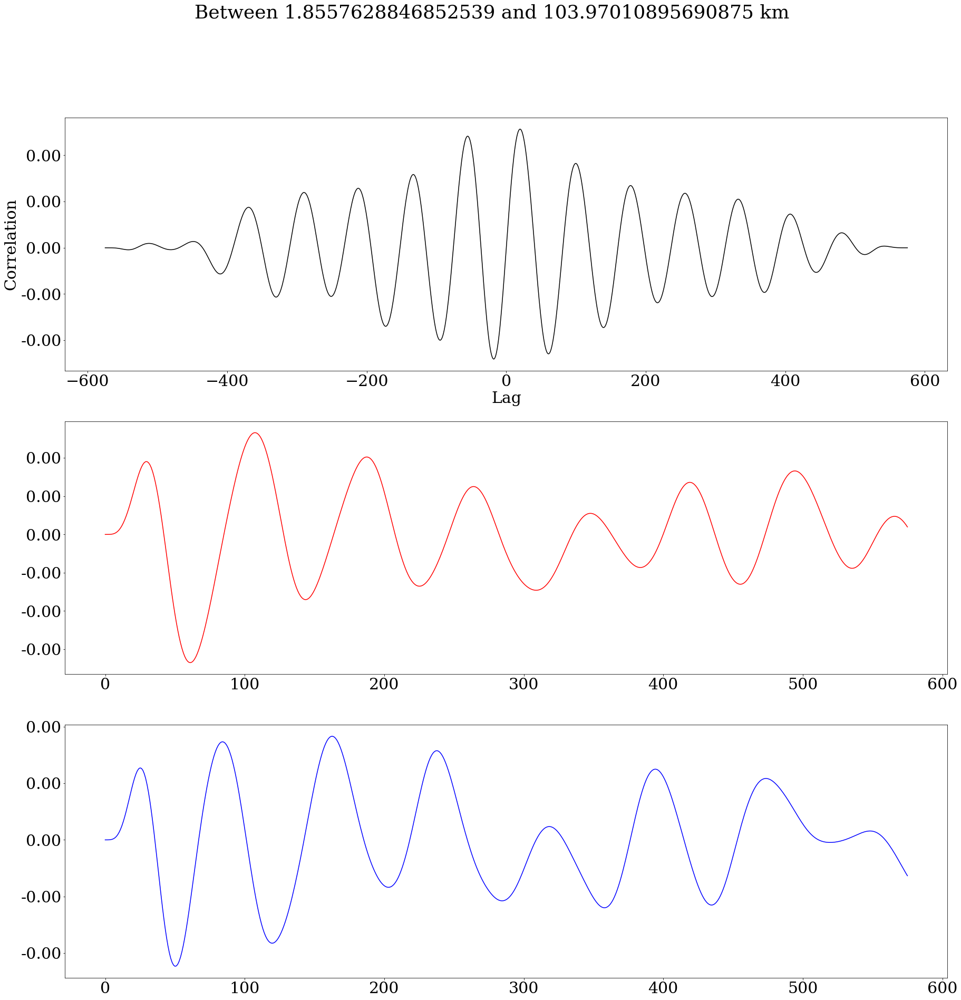

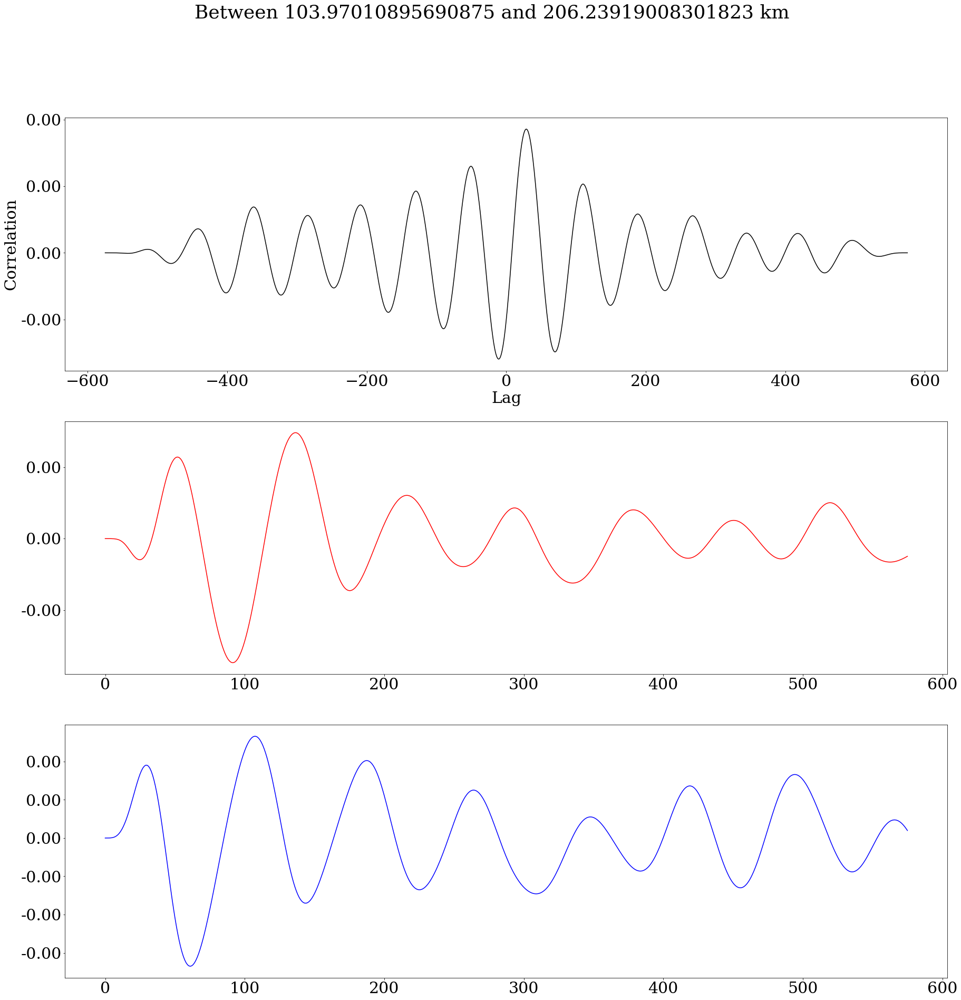

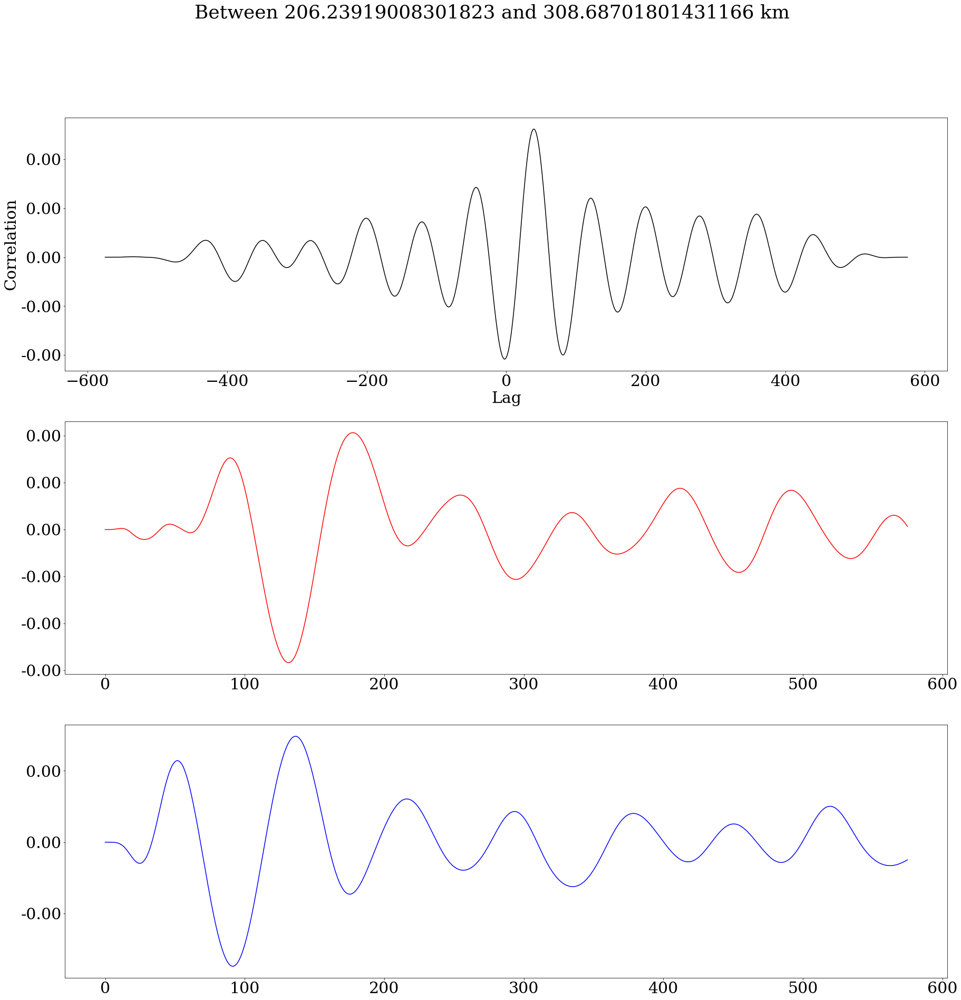

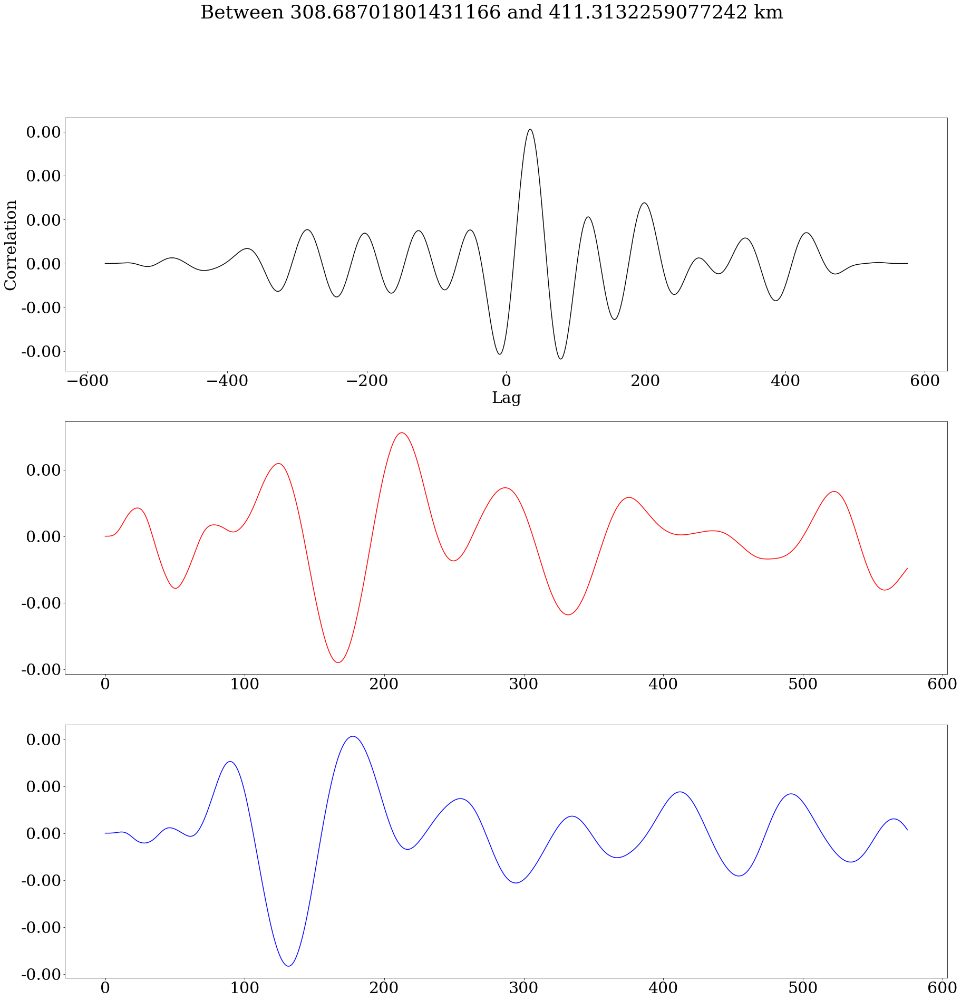

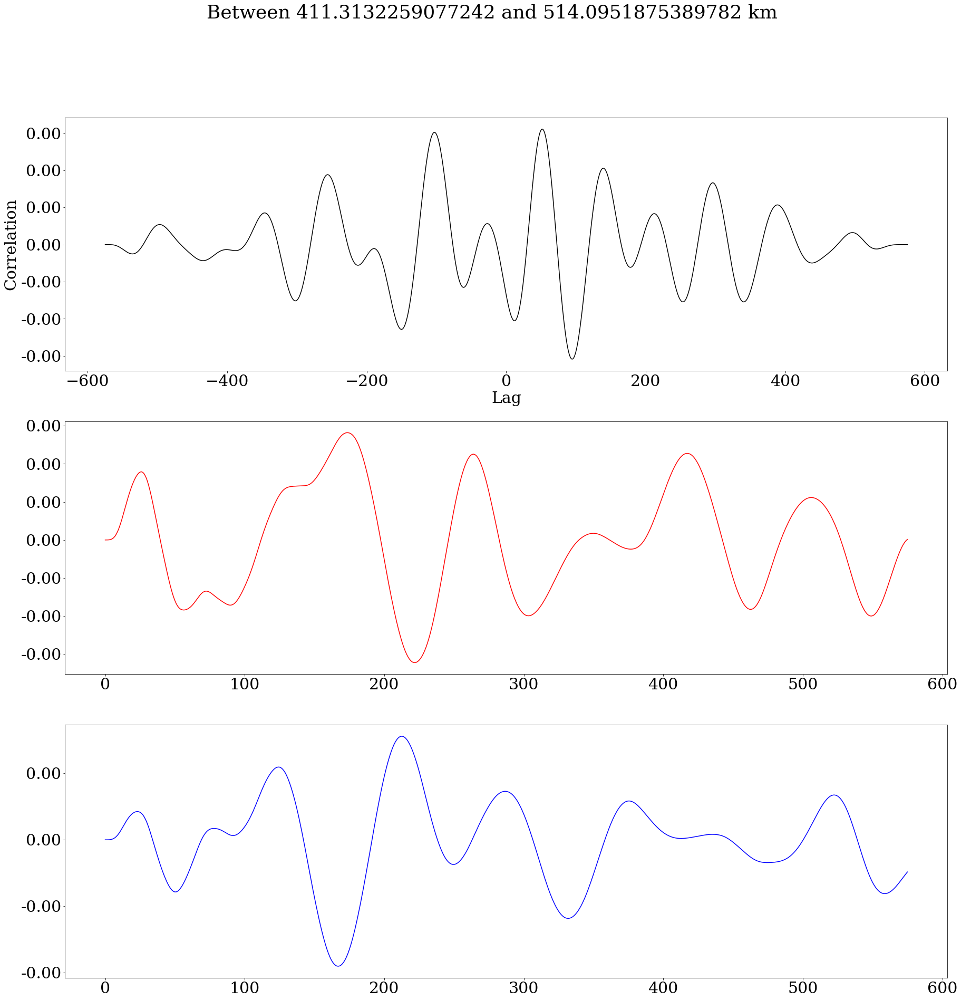

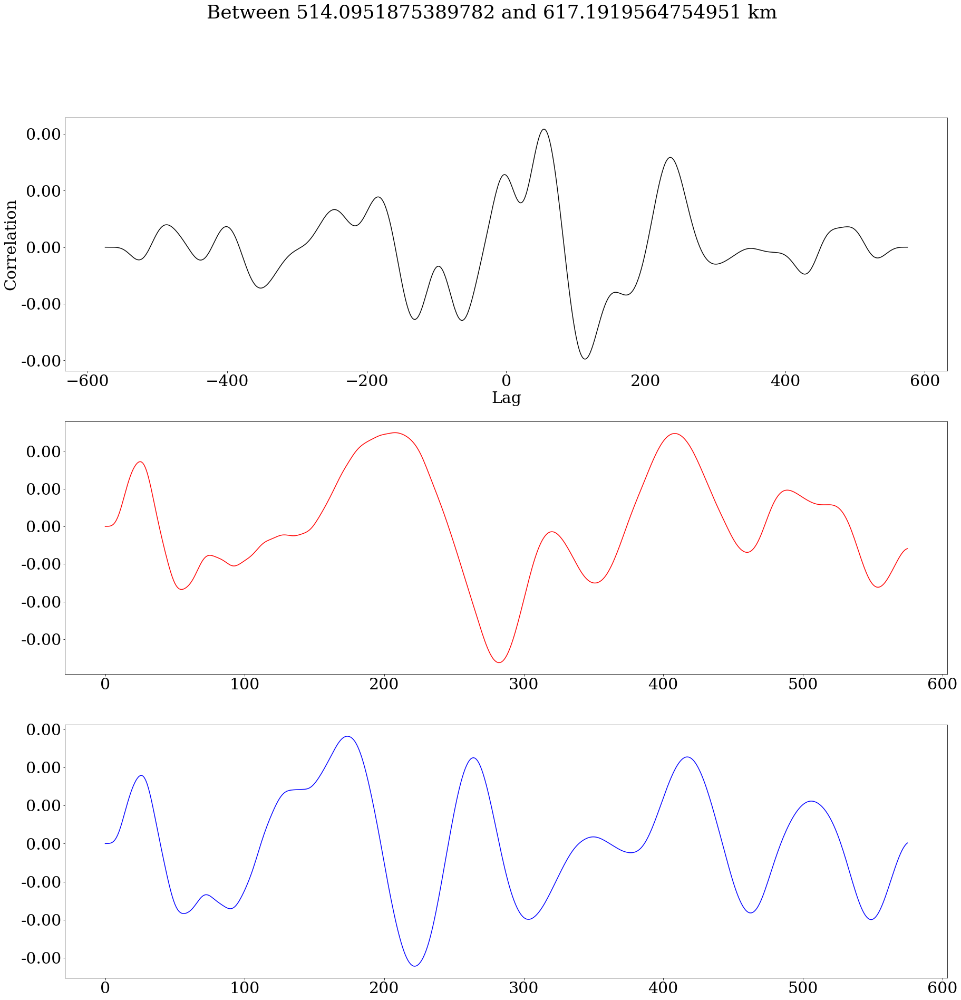

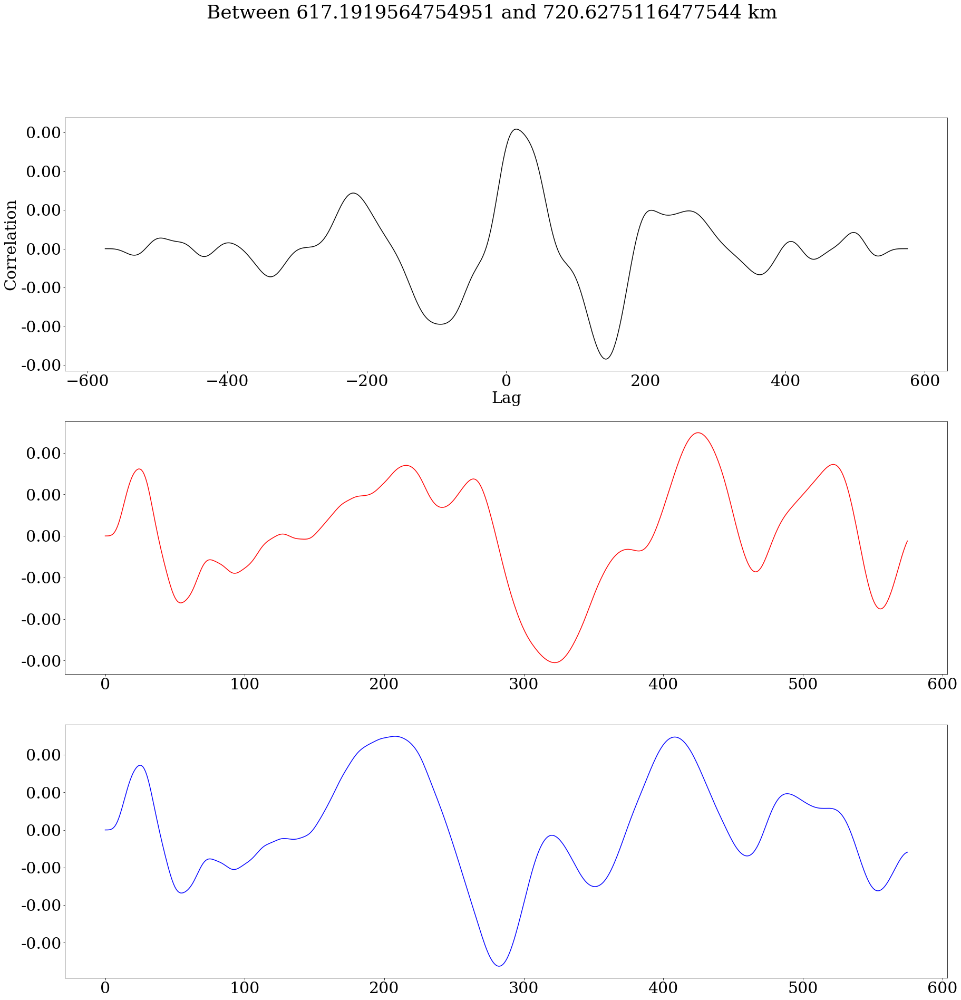

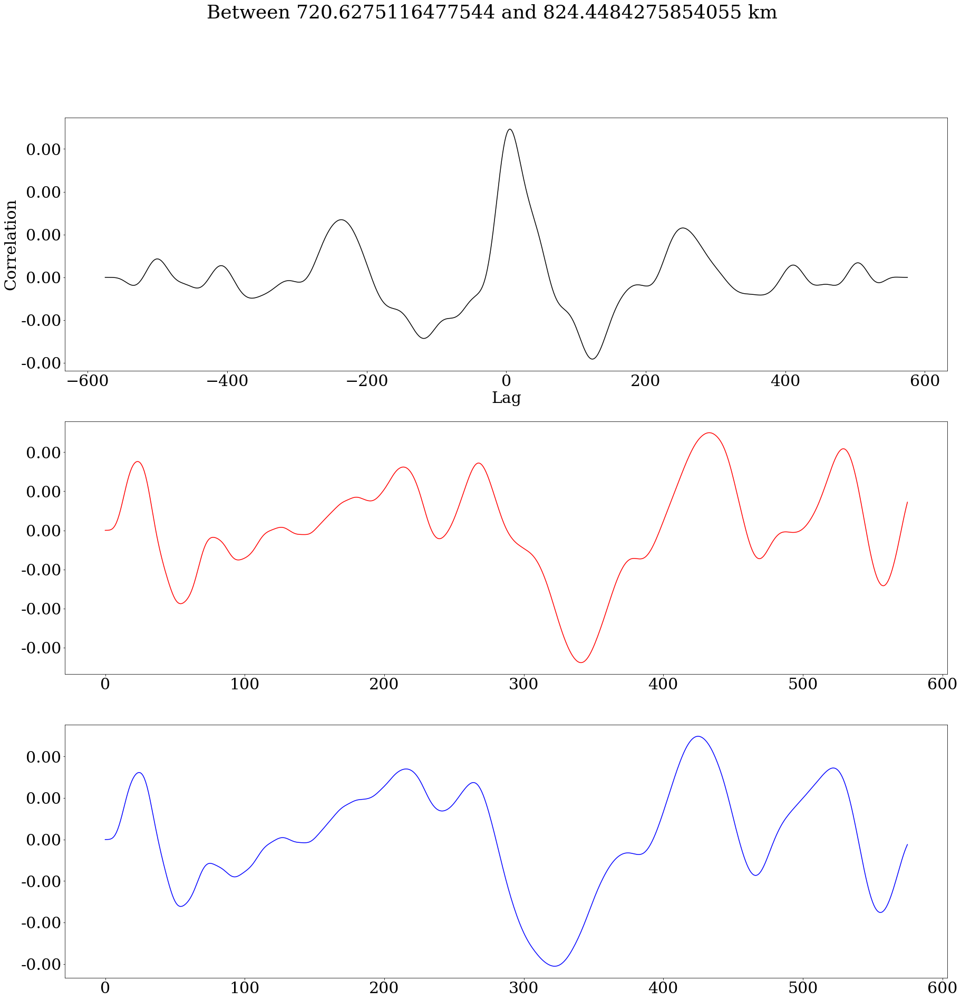

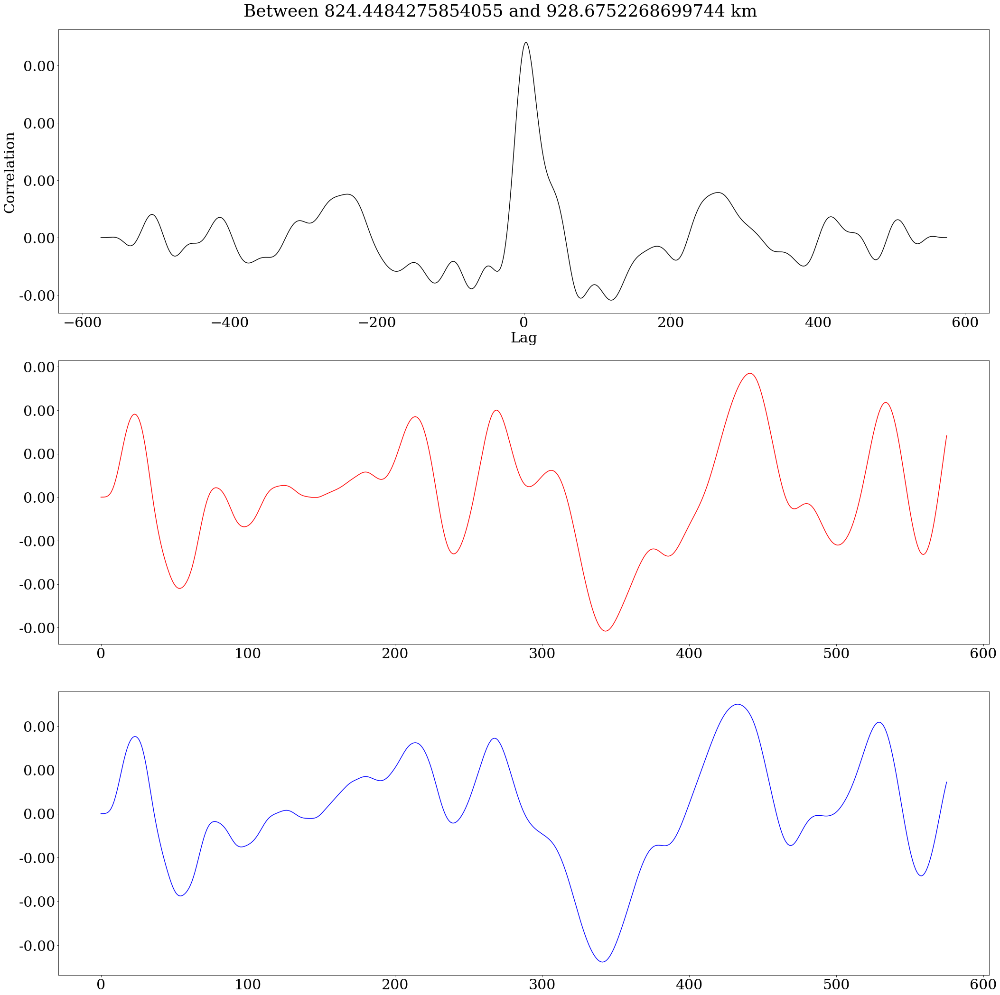

In [28]:
lag=np.zeros(10)
p=0

xlab='Lag'
ylab='Correlation'

for i in np.arange(1,10,1):
    p=p+1
    index=np.arange(0,554,55)
    in1=etafilt[:,index[i]]
    in2=etafilt[:,index[i-1]]
    out=sig.correlate(in1, in2)
    lags = sig.correlation_lags(in1.size, in2.size)
    lag[p-1] = lags[np.argmax(out)]
    fig,ax=plt.subplots(3)
    
    ax[0].plot(lags,out,'k')
    ax[1].plot(in1,'r')
    ax[2].plot(in2,'b')
    ax[0].set(xlabel=xlab, ylabel=ylab)
    
    ax[0].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    ax[1].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    ax[2].yaxis.set_major_formatter(FormatStrFormatter('%.2f'))

    fig.suptitle(f'Between {dist[index[i-1]].values} and {dist[index[i]].values} km')
    
fig.tight_layout()

In [29]:
index=np.arange(0,554,55)
c=-((dist[index[:-1]].values-dist[index[1:]].values)*1000)/((TIME[lag.astype(int)]-2880)*60)

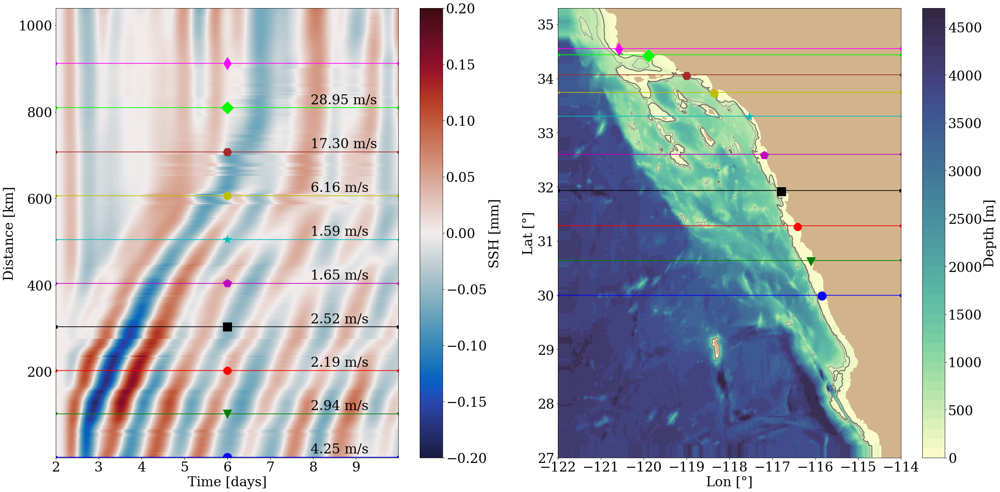

In [33]:
fig = plt.figure()
gs = GridSpec(nrows=1, ncols=2)#, height_ratios=[1,1])

lines=0
cbarall=0
vmin=-0.2
vmax=0.2
markers=Line2D.filled_markers
markers=np.delete(markers,np.arange(2,5,1))
colors=['b','g','r','k','m','c','y','brown','lime','fuchsia']

ax0 = fig.add_subplot(gs[0, 0])
plot_HOVMÖLLER(ax0,dist,TIME,etafilt,'',vmin,vmax,lat_ac,lines,cbarall)

p=0
index=np.arange(0,540,54) 
for i in index:
    p=p+1
    ax0.plot(np.ones_like(dist[i])*TIME[288],dist[i],'o', 
            markersize=18, color=colors[p-1],marker=markers[p-1])
    ax0.axhline(y=dist[i],color=colors[p-1],marker=markers[p-1])
    if i!=486:
        ax0.annotate(f'{c[p-1]:.2f} m/s',(TIME[428],dist[i+5]))


ax3 = fig.add_subplot(gs[0,1])
ax3.set_facecolor('tan')
pc = ax3.contourf(LON,LAT,np.ma.masked_array(depth, mask=maskw[0,:,:]),50,
                 vmin=0, vmax=5000, cmap=cmocean.cm.deep)#, extend='max')
cb = plt.colorbar(pc, extend='max',label='depth / m')
cn = ax3.contour(LON,LAT,depth, colors=['0.3','0.6'], 
                levels=[250,500])


p=0
for i in index:
    p=p+1
    ax3.axhline(y=LAT[lat_ac[i]],color=colors[p-1],marker=markers[p-1])
#ax3.annotate('800 km from the bay',xy=(340,350), xytext=(340, 350+50),xycoords='axes points',fontsize=10)
p=0
for ii,jj in zip(lon_ac[index],lat_ac[index]):
    p=p+1
    ax3.plot(LON[ii-1],LAT[jj-1],marker=markers[p-1], 
            markersize=18, color=colors[p-1])


cb.set_label('Depth [m]')
ax3.set_xlabel('Lon [°]')
ax3.set_ylabel('Lat [°]')
ax3.set_xlim(238-360, 246-360)
ax3.set_ylim(27,35.3)
#ax3.set_aspect(1)
fig.tight_layout()

### Calculate power spectra density and frequency of the waves
##### Using numpy functions

In [26]:
def FFRQ(dataset,datasetn):
    dist = dataset.x
    timemin = dataset.time # in min
    times = (timemin.values)*60 #in s

    t0 = 172800 # start is day 2 
    dt = 1200 # 20 min 
    timeproject=14400*60
    freqlim = (1./dt)
    
    etan=datasetn.ETA # No bay !!CHANGE TO etan when loading in other eta
    etaw=dataset.ETA #With bay
    eta = (etaw.values-etan.values)*100 
    indices=np.where(etaw[1,:]!=0)
    eta=eta[:,indices[0]]

    etadif=sig.detrend(eta,0)
    etafilt=np.zeros(np.shape(etadif))
    order = 3
    fs = 1/1200       
    cutoff =np.array([1/432000, 1/43200])
    
    for d in np.arange(np.size(etadif,1)):
        data = etadif[:,d]
        # Filtering and plotting
        etafilt[:,d] = butter_lowpass_filter(data, cutoff, fs, order)
        
        
    nx = len(dist[indices[0]])
    nt = int(len(times)/2)+1
        
    psd = np.zeros((nx,nt))*np.nan
    phase = np.zeros((nx,nt))*np.nan
    
    psdfilt = np.zeros((nx,nt))*np.nan
    phasefilt = np.zeros((nx,nt))*np.nan
    freq =  np.zeros((nx,nt))*np.nan
    freqfilt = np.zeros((nx,nt))*np.nan
    

    for ii in np.arange(nx): #nx
        signalFFT = np.fft.rfft(etadif[:,ii])
        signalFFTfilt = np.fft.rfft(etafilt[:,ii])
    
        ## Get Power Spectral Density
        signalPSD = np.abs(signalFFT)
        signalPSDfilt = np.abs(signalFFTfilt)
        #signalPSD /= len(signalFFT)**2

        ## Get Phase
        #signalPhase = np.angle(signalFFT)

        ## Get frequencies corresponding to signal 
        fftFreq = np.fft.rfftfreq(len(etadif[:,ii]), dt)
        fftFreqfilt = np.fft.rfftfreq(len(etafilt[:,ii]), dt)
        
        psd[ii,:] = signalPSD[:]
        psdfilt[ii,:] = signalPSDfilt[:]
        freq[ii,:] =  fftFreq[:]
        freqfilt[ii,:] = fftFreqfilt[:]
        #phase[ii,:] = signalPhase[:]
    
   # psd=psd[freq>=(1/timeproject)]
    #freq=freq[freq>=(1/timeproject)]
    #psd=psd[np.where(freq<=freqlim)]
    #freq=freq[freq<=freqlim]
    
   # psdfilt=psdfilt[freqfilt>=(1/timeproject)]
    #freqfilt=freqfilt[freqfilt>=(1/timeproject)]
    #psdfilt=psdfilt[freqfilt<=freqlim]
    #freqfilt=freqfilt[freqfilt<=freqlim]
        
        
    return psd, freq,psdfilt,freqfilt

In [27]:
psd, freq,psdfilt,freqfilt=FFRQ(dsw,dsn) 

##### Using scipy signal

In [38]:
nx=350
nt = int(len(TIME)/2)+1
psdsig = np.zeros((nx,nt))*np.nan   
psdsigfilt = np.zeros((nx,nt))*np.nan


freqsig =  np.zeros((nx,nt))*np.nan
freqsigfilt = np.zeros((nx,nt))*np.nan

    
for ii in np.arange(nx):
    freqi, ped = sig.periodogram(etadif[:,ii],fs=20)
    freqifilt, pedfilt = sig.periodogram(etafilt[:,ii],fs=20)
    psdsig[ii,:]=ped
    freqsig[ii,:]=freqi
    psdsigfilt[ii,:]=pedfilt
    freqsigfilt[ii,:]=freqifilt
    

    

### Use calcualted PSD and Frequency to find frequency and period with highest density 
##### For unfiltered values

In [39]:
peak=freq[1,np.where(psd[1,1:]==max(psd[1,1:]))]

period=1/peak
print(period/(60*60*24))

[[1.33333333]]


##### For filtered values

In [40]:
peakfilt=freqfilt[1,np.where(psdfilt[1,1:]==max(psdfilt[1,1:]))]

periodfilt=1/peakfilt[0]
print(periodfilt/(60*60*24))

[1.33333333]


### Plot the PSD over Frequency 

In [59]:
def plotfreqdens(freq,psd,freqfilt,psdfilt):
    fig, ax = plt.subplots(2,2)
    xlab='Frequency [Hz]'
    ylab='Power density spectra [W/Hz]'
    
    
    ax[0,0].plot(freq[0,freq[0,:]>0],psd[0,freq[0,:]>0])
    ax[1,0].plot(freqfilt[0,freqfilt[0,:]>0],psdfilt[0,freqfilt[0,:]>0])
    ax[0,1].plot(freq[-1,freq[-1,:]>0],psd[-1,freq[-1,:]>0])
    ax[1,1].plot(freqfilt[-1,freqfilt[-1,:]>0],psdfilt[-1,freqfilt[-1,:]>0])
    peak=freq[0,np.argmax(psd[0,freq[0,:]>0])]
    period=1/peak
    peakend=freq[-1,np.argmax(psd[-1,freq[-1,:]>0])]
    periodend=1/peakend

    peakfilt=freqfilt[0,np.argmax(psdfilt[0,freqfilt[0,:]>0])]
    periodfilt=1/peakfilt

    peakfiltend=freqfilt[-1,np.argmax(psdfilt[-1,freqfilt[-1,:]>0])]
    periodfiltend=1/peakfiltend

    title=(f'Nonfiltered data:\n\n Beginning of bay:  \n Period {period/(60*60*24):.2f} days \
    \n Peak frequency {peak:.2f} Hz')
    titlefilt=(f'Filtered data:\n\n Beginning of bay:  \n Period {periodfilt/(60*60*24):.2f} days \
    \n Peak frequency {peakfilt:.2f}Hz')
    titleend=(f'End of bay: \n Period {periodend/(60*60*24):.2f} days \
    \n Peak frequency {peakend:.2f} Hz')
    titlefiltend=(f'End of bay:\n Period {periodfiltend/(60*60*24):.2f} days \
    \n Peak frequency {peakfiltend:.2f} Hz')

    ax[0,0].set(xlabel=xlab, ylabel=ylab,title=title)
    ax[1,0].set(xlabel=xlab, ylabel=ylab,title=titleend)

    ax[0,1].set(xlabel=xlab, ylabel=ylab,title=titlefilt)
    ax[1,1].set(xlabel=xlab, ylabel=ylab,title=titlefiltend)

    fig.tight_layout()


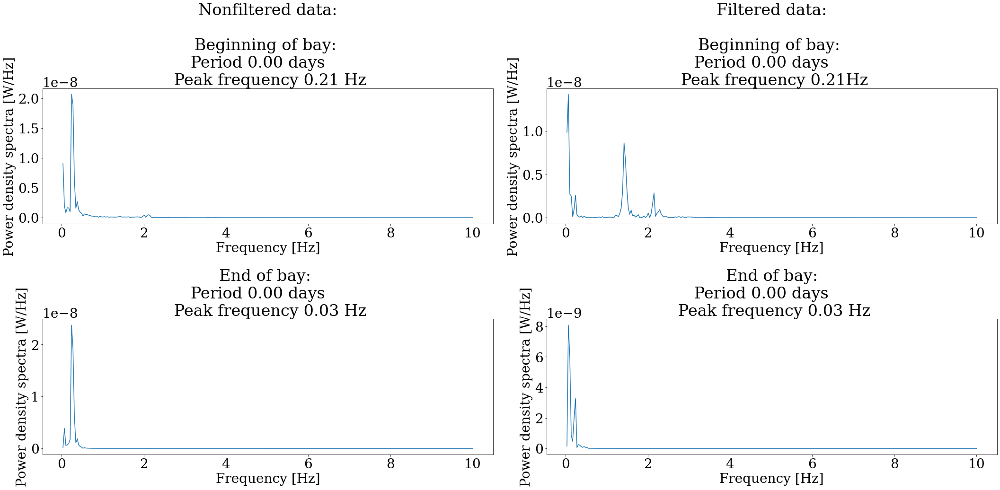

In [60]:

plotfreqdens(freqsig,psdsig,freqsigfilt,psdsigfilt)

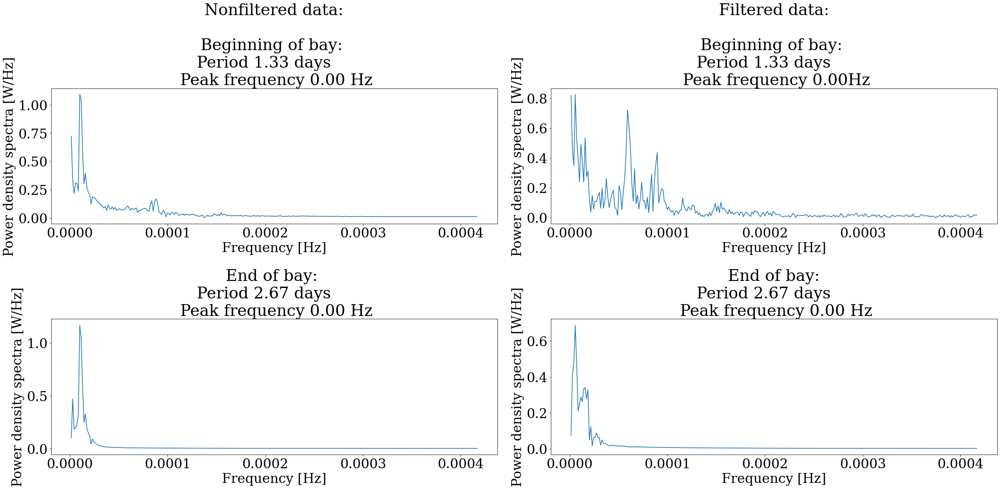

In [61]:
plotfreqdens(freq,psd,freqfilt,psdfilt)

### Calculate period for every value of PSD

In [28]:
timepsd=np.arange(2880,TIME[-1],40)
timepsd=np.append(timepsd,14400)
periodsplot=(1/freq[:,:])/(60*60*24)
periodsplotfilt=(1/freqfilt[:,:])/(60*60*24)

In [63]:
timepsdsig=np.arange(2880,TIME[-1],40)
timepsdsig=np.append(timepsdsig,14400)
periodsplotsig=(1/freqsig[:,:])/(60*60*24)
periodsplotfiltsig=(1/freqsigfilt[:,:])/(60*60*24)

### Plot distance, period and PSD to see what period and what area has highest PSD

In [38]:
params = {'font.size': 28,
          'figure.figsize': (15, 30),
         'font.family':'serif'}
pl.rcParams.update(params)

Highest energy is at 165.31 km from the bay


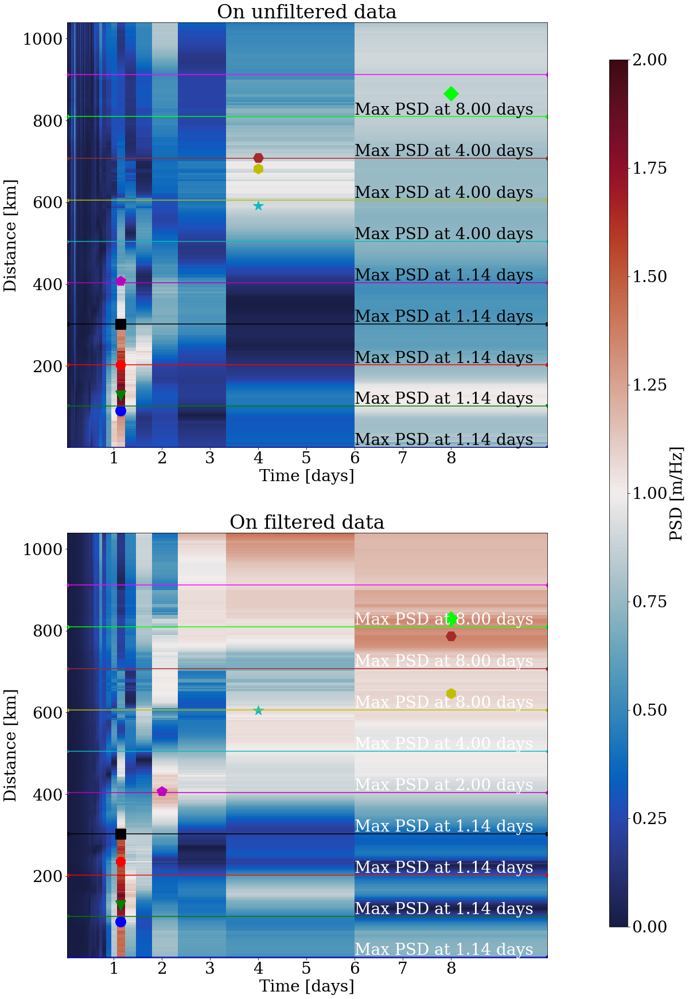

In [39]:
fig, ax = plt.subplots(2)

vmin=0
vmax=2
psdplot=np.transpose(psd[:,1:])
title='PSD [m/Hz]'
xlab='Time [days]'
ylab='Distance [km]'

#time= TIME.values.astype(int)
#time=dat.date2num(TIME)
markers=Line2D.filled_markers
markers=np.delete(markers,np.arange(2,5,1))
colors=['b','g','r','k','m','c','y','brown','lime','fuchsia']

ax[0].set(xlabel=xlab, ylabel=ylab,title='On unfiltered data')
ax[0].set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8])
ax[0].set_xticklabels([0, 1, 2, 3, 4, 5, 6, 7, 8])

#val=VAL.values
cax = ax[0].pcolormesh(periodsplot[1,1:],dist,psd[:,1:],vmin=vmin,vmax=vmax, cmap=cmocean.cm.balance)


ax[1].set(xlabel=xlab, ylabel=ylab,title='On filtered data')
ax[1].set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8])
ax[1].set_xticklabels([0, 1, 2, 3, 4, 5, 6, 7, 8])

#val=VAL.values
cax1 = ax[1].pcolormesh(periodsplotfilt[1,1:],dist,psdfilt[:,1:],vmin=vmin,vmax=vmax, cmap=cmocean.cm.balance)
#ax.xaxis.set_major_locator(dat.MonthLocator())


p=0
#index=[0,57,114,173,226]
index=np.arange(0,540,54) 
for i in index:
    p=p+1
    ax[1].axhline(y=dist[i],color=colors[p-1],marker=markers[p-1])
    if i!=486:
        
        
        locfilt=np.where(psdfilt[index[p-1]:index[p],:]==np.max(psdfilt[index[p-1]:index[p],:]))

        peakfilt=periodsplotfilt[locfilt]
        
        ax[1].plot(peakfilt,dist[locfilt[0]+i],'o', 
            markersize=18, color=colors[p-1],marker=markers[p-1])
        
        ax[1].annotate(f'Max PSD at {peakfilt[0]:.2f} days',(6,dist[i+3]),color='w')

p=0
#index=[0,57,114,173,226]
index=np.arange(0,540,54) 
for i in index:
    p=p+1
    ax[0].axhline(y=dist[i],color=colors[p-1],marker=markers[p-1])
    if i!=486:
        
        
        loc=np.where(psd[index[p-1]:index[p],:]==np.max(psd[index[p-1]:index[p],:]))

        peak=periodsplot[loc]
        
        ax[0].plot(peak,dist[loc[0]+i],'o', 
            markersize=18, color=colors[p-1],marker=markers[p-1])
        
        ax[0].annotate(f'Max PSD at {peak[0]:.2f} days',(6,dist[i+3]),color='k')

cbar_ax = fig.add_axes([1, 0.15, 0.03, 0.7])
fig.colorbar(cax, cax=cbar_ax)
cbar_ax.set_ylabel(title)

print(f'Highest energy is at {dist[np.argmax(psdfilt[:,6])].values:.2f} km from the bay')
#print(f'For the nonfiltetered data max PSD is found at period {peak} days and at distance {peakdist} km from the bay')

#print(f'For the filtered data max PSD is found at period {peakfilt} days and at distance {peakfiltdist} km from the bay')

In [33]:
np.argmax(psdfilt)

19659

##### Finding the energy distribution along the coast, using the energy of the wave (i.e. the variance of the sea level anomalies)
Maximum is at the same distance as where the maximum psd is

In [10]:
varname='WVEL'
i=1
pathn='/media/amelia/Trillian/SVB/exp06_512x612x100_ORL/01_noSVB_febTS/'+ str(varname)+'ACnoSVBdep55'+ str(2+i)+'_'+ str(3+i) +'all.nc'
ds  = xr.open_dataset(pathn)
lon_acWVEL=ds.lonAC
lat_acWVEL=ds.latAC
distacWVEL=ds.x

In [64]:
LAT[lat_acWVEL[58]]

<xarray.DataArray 'YC' ()>
array(30.842)
Coordinates:
    YC       >f8 30.84
    x        float64 109.7
Attributes:
    standard_name:  latitude
    long_name:      latitude
    units:          degrees_north
    coordinate:     YC XC
    axis:           Y

Highest energy is at 154.15 km from the bay


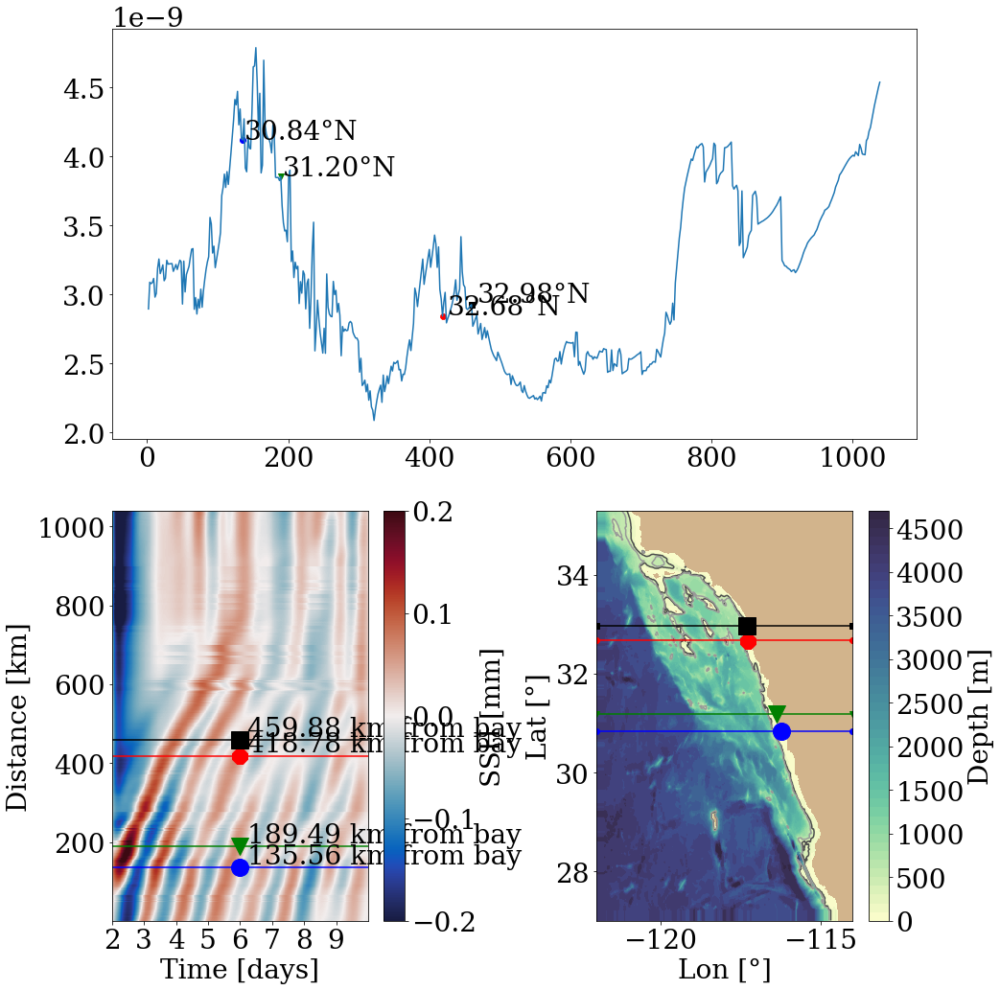

In [21]:
energy = np.var(etafilt,axis=0)
fig = plt.figure()
gs = GridSpec(nrows=2, ncols=2)#, height_ratios=[1,1])
ax = fig.add_subplot(gs[0, 0:])
ax.plot(dist,energy)
markers=Line2D.filled_markers
markers=np.delete(markers,np.arange(2,5,1))
colors=['b','g','r','k','m','c','y','brown','lime','fuchsia']
hej=[72, 101, 224, 246] #hej=[58, 85, 205, 227]
p=0
for i in hej:
    p=p+1

    ax.scatter(dist[i],energy[i],color=colors[p-1],marker=markers[p-1])
    ax.annotate(f'{LAT[lat_ac[i]].values:.2f}°N',(dist[i]+i/30,energy[i]+p*5*1e-12),color='k') 
#plt.xlabel('Distance from the bay (km)')
#plt.ylabel('Variance in SSH')
print(f'Highest energy is at {dist[np.argmax(energy)].values:.2f} km from the bay')


lines=0
cbarall=0
vmin=-0.2
vmax=0.2


ax0 = fig.add_subplot(gs[1, 0])
plot_HOVMÖLLER(ax0,dist,TIME,etafilt,'',vmin,vmax,lat_ac,lines,cbarall)

p=0
for i in hej:
    p=p+1
    ax0.axhline(y=dist[i],color=colors[p-1])
    ax0.plot(TIME[288],dist[i],'o', 
            markersize=18, color=colors[p-1],marker=markers[p-1])
    ax0.annotate(f'{dist[i].values:.2f} km from bay',(TIME[305],dist[i]+10),color='k') 


ax3 = fig.add_subplot(gs[1,1])
ax3.set_facecolor('tan')
pc = ax3.contourf(LON,LAT,np.ma.masked_array(depth, mask=maskw[0,:,:]),50,
                 vmin=0, vmax=5000, cmap=cmocean.cm.deep)#, extend='max')
cb = plt.colorbar(pc, extend='max',label='depth / m')
cn = ax3.contour(LON,LAT,depth, colors=['0.3','0.6'], 
                levels=[250,500])


p=0
for i in hej:
    p=p+1
    ax3.axhline(y=LAT[lat_ac[i]],color=colors[p-1],marker=markers[p-1])
#ax3.annotate('800 km from the bay',xy=(340,350), xytext=(340, 350+50),xycoords='axes points',fontsize=10)
p=0
for ii,jj in zip(lon_ac[hej],lat_ac[hej]):
    p=p+1
    ax3.plot(LON[ii-1],LAT[jj-1],marker=markers[p-1], 
            markersize=18, color=colors[p-1])


cb.set_label('Depth [m]')
ax3.set_xlabel('Lon [°]')
ax3.set_ylabel('Lat [°]')
ax3.set_xlim(238-360, 246-360)
ax3.set_ylim(27,35.3)
#ax3.set_aspect(1)
fig.tight_layout()

In [ ]:
fig, ax = plt.subplots(2,figsize=(30,30))

vmin=0
vmax=0.02
psdplot=np.transpose(psd[:,1:])
title='PSD [m/Hz]'
xlab='Time [days]'
ylab='Distance [km]'

#time= TIME.values.astype(int)
#time=dat.date2num(TIME)

ax[0].set(xlabel=xlab, ylabel=ylab)
ax[0].set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8])
ax[0].set_xticklabels([0, 1, 2, 3, 4, 5, 6, 7, 8])

#val=VAL.values freqsig,psdsig,freqsigfilt,psdsigfilt
cax = ax[0].pcolormesh(periodsplotsig[1,:],dist,psdsig[:,1:],vmin=vmin,vmax=vmax, cmap=cmocean.cm.balance)

ax[1].set(xlabel=xlab, ylabel=ylab)
ax[1].set_xticks([0, 1, 2, 3, 4, 5, 6, 7, 8])
ax[1].set_xticklabels([0, 1, 2, 3, 4, 5, 6, 7, 8])

#val=VAL.values
cax = ax[1].pcolormesh(periodsplotfiltsig[1,:],dist,psdsigfilt[:,1:],vmin=vmin,vmax=vmax, cmap=cmocean.cm.balance)
#ax.xaxis.set_major_locator(dat.MonthLocator())

cbar_ax = fig.add_axes([1, 0.15, 0.03, 0.7])
fig.colorbar(cax, cax=cbar_ax)
cbar_ax.set_ylabel(title)

peaksig=periodsplotsig[1,np.where(psdsig[1,1:]==max(psdsig[1,1:]))]
peakfiltsig=periodsplotfiltsig[1,np.where(psdsigfilt[1,1:]==max(psdsigfilt[1,1:]))]

print(f'For the nonfiltetered data max PSD is found at period {peaksig} ')

print(f'For the filtered data max PSD is found at period {peakfiltsig}')

### Plotting the whole basin

In [13]:
def plot_above(ax,mask,LON,LAT, VAL,title,vmin,vmax,lat_fix,lon_fix,etafilt):
    
    xlab='Longitude [°]'
    ylab='Latitude [°]'
    
    
    ax.set_facecolor('wheat')
    cax = ax.pcolormesh(LON,LAT,np.ma.masked_array(VAL, mask=mask)*100,cmap=cmocean.cm.balance,vmin=vmin,vmax=vmax)
    for ii,jj in zip(lon_fix,lat_fix):

        ax.plot(LON[ii-1],LAT[jj-1],'o', 
                markersize=10, color='r')
 
    asign=np.sign(etafilt)
    signchange = np.where(((np.roll(asign, 1) - asign) != 0))
   
    
    ax.plot(LON[lon_fix[signchange]],LAT[lat_fix[signchange]],'o', 
                markersize=10, color='b')
    
    ax.set_title(title)
    cbar_ax = plt.colorbar(cax, ax=ax)
    ax.set(xlabel=xlab, ylabel=ylab)
    cbar_ax.set_label('SSH [mm]')
    ax.set_xlim(-122,-114) 
    ax.set_ylim(27,35.3)


In [46]:
params = {'font.size': 27,
          'figure.figsize': (40, 17),
         'font.family':'serif'}
pl.rcParams.update(params)


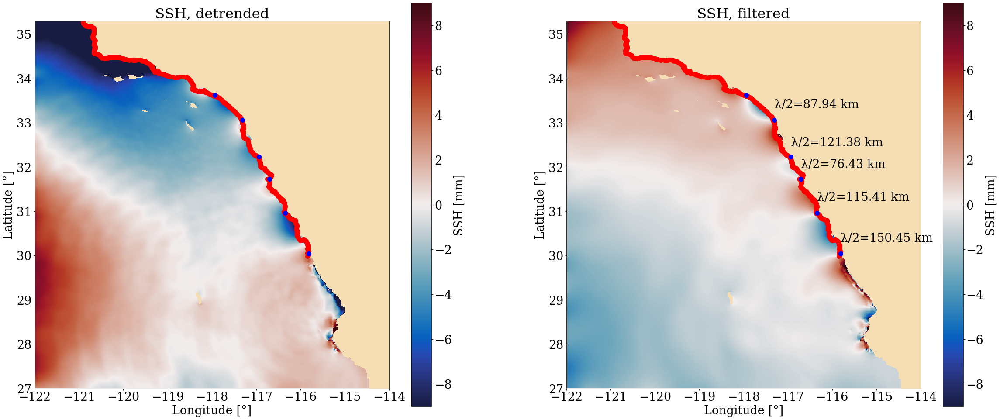

In [47]:
fig,ax=plt.subplots(1,2)
vmin=-0.009*1000
vmax=0.009*1000
ind=220
plot_above(ax[0],maskw[0,:,:],LON,LAT,etadifall[ind,:,:]*1000,'SSH, detrended',
           vmin,vmax,lat_ac,lon_ac,etafilt[ind,:])
plot_above(ax[1],maskw[0,:,:],LON,LAT,etafiltall[ind,:,:]*1000,'SSH, filtered',
           vmin,vmax,lat_ac,lon_ac,etafilt[ind,:])


asign=np.sign(etafilt[ind,:])
signchange = np.where(((np.roll(asign, 1) - asign) != 0))
wavelen=dist.values[signchange[0][1:]]-dist.values[signchange[0][:-1]]

for i in np.arange(len(signchange[0][:-1])):
                                                  
    ax[1].annotate(f'λ/2={wavelen[i]:.2f} km',(LON[lon_ac[signchange[0][i]]],LAT[lat_ac[signchange[0][i]+20]]),color='k')
p=0
#index=np.arange(0,540,54) 
#for i in index:
 #   p=p+1
  #  ax[0].axhline(y=LAT[lat_fix[i]],color=colors[p-1],marker=markers[p-1])
   # ax[1].axhline(y=LAT[lat_fix[i]],color=colors[p-1],marker=markers[p-1])
#ax3.annotate('800 km from the bay',xy=(340,350), xytext=(340, 350+50),xycoords='axes points',fontsize=10)
#p=0
#for ii,jj in zip(lon_fix[index],lat_fix[index]):
 #   p=p+1
  #  ax[0].plot(LON[ii-1],LAT[jj-1],marker=markers[p-1], 
   #         markersize=18, color=colors[p-1])
    #ax[1].plot(LON[ii-1],LAT[jj-1],marker=markers[p-1], 
     #       markersize=18, color=colors[p-1])
ax[0].set_aspect(1)
ax[1].set_aspect(1)

In [92]:
etafilt[200,:]
asign=np.sign(etafilt[200,:])
signchange = np.where(((np.roll(asign, 1) - asign) != 0))

In [93]:
dist.values[signchange[0][1:]]-dist.values[signchange[0][:-1]]

array([ 72.39018959, 145.02244305,  74.50905428, 138.08427677,
        87.84680241])

In [114]:
print('λ')

λ


## Other way of filtering

In [15]:
#filteta=sc.ndimage.median_filter(etadif[:,0],size=7)
filteta=sig.medfilt(etadif[:,d*0],kernel_size=17)

In [9]:
filteta=np.ones_like(etadif)
for i in np.arange(np.size(etadif,1)):
    
    filteta[:,i]=sig.medfilt(etadif[:,i],kernel_size=17)

## Animation

In [15]:
Writer = animation.writers['ffmpeg']
writer = Writer(fps=4, metadata=dict(artist='AM'), bitrate=2000)

In [20]:
def animate(t):
    tt=(t*20+2880)/60
    print(t)
    eta = etaPRE[t,:,:]*1000
    

    cax.set_array(np.ma.masked_array(eta,mask=maskw[0,:,:])*100)
    ax.set_title(f'After {tt:.1f} hours')

0
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276


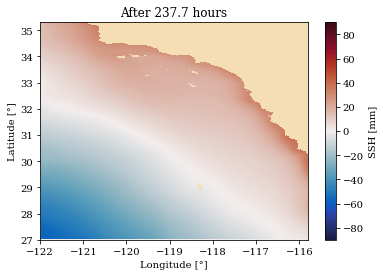

In [21]:
fig, ax = plt.subplots()

 #495.7 meter depth is the 55th element

vmin=-0.09*1000
vmax=0.09*1000

t=0
ind=0
tt=((t*20)+2880)/60
VAL=etaPRE[0,:,:]*1000

xlab='Longitude [°]'
ylab='Latitude [°]'

ax.set_facecolor('wheat')
cax = ax.pcolormesh(LON,LAT,np.ma.masked_array(VAL, mask=maskw[0,:,:])*100,
                    cmap=cmocean.cm.balance,vmin=vmin,vmax=vmax)

ax.set(xlabel=xlab, ylabel=ylab)

ax.set_title(f'After {tt:.1f} hours')
ax.set_xlim(-122,-115.8)     
cbar = plt.colorbar(cax)
cbar.set_label('SSH [mm]')
ax.set_ylim(27,35.3)

anim = FuncAnimation(fig, animate,frames=570, repeat=False)

    
anim.save('ETAnonfilt.mp4', writer=writer, dpi=600)


(27.0, 35.3)

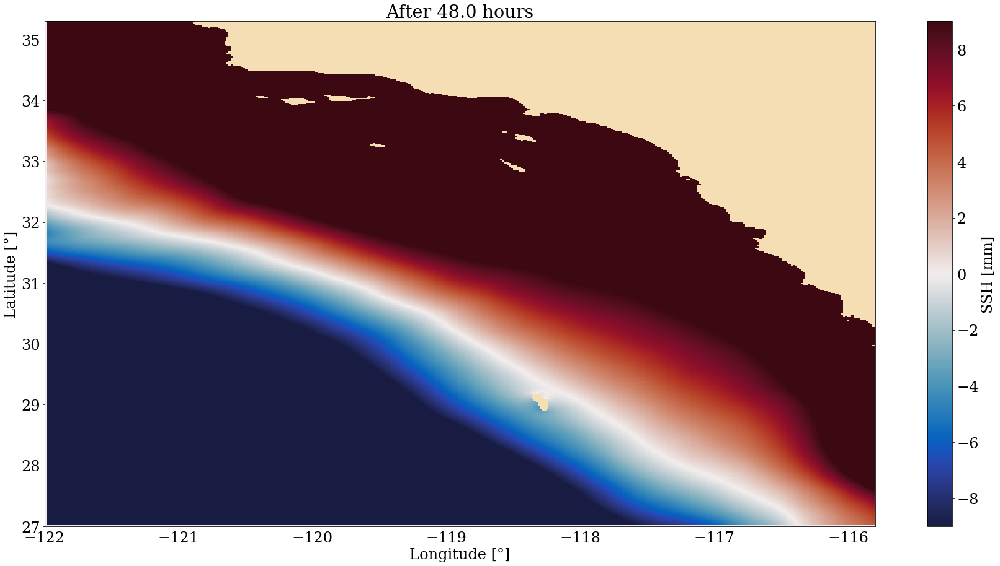

In [75]:
fig, ax = plt.subplots()
vmin=-0.009*1000
vmax=0.009*1000

t=0

tt=((t*20)+2880)/60
VAL=etaPRE[575,:,:]*1000

xlab='Longitude [°]'
ylab='Latitude [°]'

ax.set_facecolor('wheat')
cax = ax.pcolormesh(LON,LAT,np.ma.masked_array(VAL, mask=maskw[0,:,:])*100,
                    cmap=cmocean.cm.balance,vmin=vmin,vmax=vmax)

ax.set(xlabel=xlab, ylabel=ylab)

ax.set_title(f'After {tt:.1f} hours')
ax.set_xlim(-122,-115.8)     
cbar = plt.colorbar(cax)
cbar.set_label('SSH [mm]')
ax.set_ylim(27,35.3)

# Plotting Velocity and SSH together

In [46]:
i=2
varname='DYNVARS'
pathn='/media/amelia/Trillian/SVB/exp06_512x612x100_ORL/01_noSVB_febTS/'+ str(varname)+'noSVB'+ str(2+i)+'_'+ str(3+i) +'.nc'
pathw='/media/amelia/Trillian/SVB/exp06_512x612x100_ORL_SVB/01_SVB_febTS/'+ str(varname)+'withSVB'+ str(2+i)+'_'+ str(3+i) +'.nc'
        
dsw  = xr.open_dataset(pathw)
dsn = xr.open_dataset(pathn)

Ww=dsw.WVEL[-24,:,:,:].values
Wn=dsn.WVEL[-24,:,:,:].values
time=dsw.time.values.astype(int)
TIMEvel=time*1e-9

Vw=dsw.VVEL[0,:,:,:].values
Vn=dsn.VVEL[0,:,:,:].values



In [50]:
5760/(60*24)

4.0

In [47]:
TIMEvel

array([5760., 5780., 5800., 5820., 5840., 5860., 5880., 5900., 5920.,
       5940., 5960., 5980., 6000., 6020., 6040., 6060., 6080., 6100.,
       6120., 6140., 6160., 6180., 6200., 6220., 6240., 6260., 6280.,
       6300., 6320., 6340., 6360., 6380., 6400., 6420., 6440., 6460.,
       6480., 6500., 6520., 6540., 6560., 6580., 6600., 6620., 6640.,
       6660., 6680., 6700., 6720., 6740., 6760., 6780., 6800., 6820.,
       6840., 6860., 6880., 6900., 6920., 6940., 6960., 6980., 7000.,
       7020., 7040., 7060., 7080., 7100., 7120., 7140., 7160., 7180.])

In [43]:
np.where(TIME==TIMEvel[0])[0][0]

216

In [29]:
params = {'font.size': 16,
          'figure.figsize': (10, 8),
         'font.family':'serif'}
pl.rcParams.update(params)


In [30]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

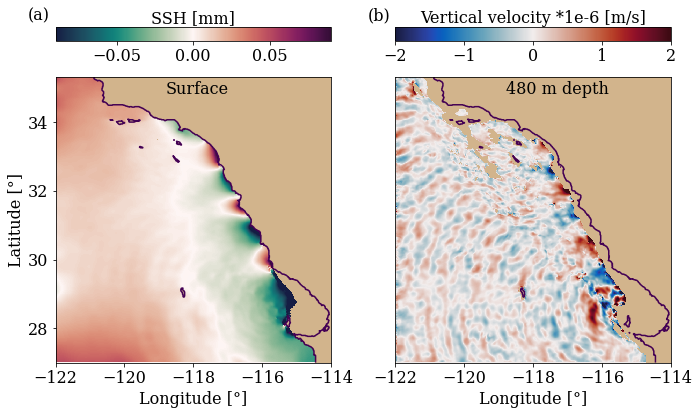

In [48]:
fig = plt.figure()
gs = GridSpec(nrows=1, ncols=2)

vmin=-0.009*10
vmax=0.009*10
ind=np.where(TIME==TIMEvel[0])[0][0]

xlab='Longitude [°]'
ylab='Latitude [°]'

ax = fig.add_subplot(gs[0,0]) 
ax.set_facecolor('tan')
cax = ax.pcolormesh(LON,LAT,np.ma.masked_array(etafiltall[ind,:,:]*1000, mask=maskw[0,:,:]),cmap=cmocean.cm.curl,vmin=vmin,vmax=vmax)
ax.contour(LON,LAT,depth, levels=[0], color='k')
divider = make_axes_locatable(ax)
axdiv = divider.new_vertical(size = '5%', pad = 0.5)
fig.add_axes(axdiv)
cbar_ax = plt.colorbar(cax, cax=axdiv,orientation='horizontal')
cbar_ax.ax.xaxis.set_label_position("top")

ax.set(xlabel=xlab, ylabel=ylab)
cbar_ax.set_label('SSH [mm]')
ax.set_xlim(-122,-114) 
ax.set_ylim(27,35.3)
ax.text(-0.1,1.2, '(a)', transform=ax.transAxes)
ax.text(0.40,0.94, 'Surface', transform=ax.transAxes)
ax.set_aspect(1)

#vmin=-0.008*100
#vmax=0.008*100

#ax = fig.add_subplot(gs[0,1]) 
#ax.set_facecolor('tan')
#cax = ax.pcolormesh(LON,LAT,np.ma.masked_array(Vw[0,:,:]-Vn[0,:,:], mask=maskw[0,:,:])*1000,cmap=cmocean.cm.balance,vmin=vmin,vmax=vmax)
#ax.contour(LON,LAT,depth, levels=[0], color='k')

#divider = make_axes_locatable(ax)
#axdiv = divider.new_vertical(size = '5%', pad = 0.5)
#fig.add_axes(axdiv)
#cbar_ax = plt.colorbar(cax, cax=axdiv,orientation='horizontal')
#cbar_ax.ax.xaxis.set_label_position("top")

#ax.set(xlabel=xlab)
#cbar_ax.set_label('V velocity [mm/s]')
#ax.set_xlim(-122,-114) 
#ax.set_ylim(27,35.3)
#ax.text(0.90,0.94, '(b)', transform=ax.transAxes)
#ax.text(0.40,0.94, 'Surface', transform=ax.transAxes)
#ax.set_yticks([])
#ax.set_aspect(1)
vmin=-0.000002*1e6
vmax=0.000002*1e6


ax = fig.add_subplot(gs[0,1]) 
ax.set_facecolor('tan')
cax = ax.pcolormesh(LON,LAT,np.ma.masked_array(Ww[55,:,:]-Wn[55,:,:], mask=maskw[55,:,:])*1e6,cmap=cmocean.cm.balance,vmin=vmin,vmax=vmax)

divider = make_axes_locatable(ax)
axdiv = divider.new_vertical(size = '5%', pad = 0.5)
fig.add_axes(axdiv)
cbar_ax = plt.colorbar(cax, cax=axdiv,orientation='horizontal')
cbar_ax.ax.xaxis.set_label_position("top")
ax.set(xlabel=xlab)
cbar_ax.set_label('Vertical velocity *1e-6 [m/s]')
ax.contour(LON,LAT,depth, levels=[0], color='k')
ax.set_yticks([])

ax.text(0.40,0.94, '480 m depth', transform=ax.transAxes)
ax.text(-0.1,1.2, '(b)', transform=ax.transAxes)

ax.set_xlim(-122,-114) 
ax.set_ylim(27,35.3)
ax.set_aspect(1)

fig.tight_layout()